# Basic imports

In [1]:
%reload_ext autoreload
%autoreload 2

import uproot
import polars as pl
import numpy as np
from tqdm import tqdm
import awkward as ak
import matplotlib.pyplot as plt
import pandas as pd
import os
from systs import SystConfig, CAFManager, Systematic, MultiPlot, VariationManager, SystAnalyzer, Flavor, create_oscillation_yaml_from_systematics
plt.rcParams.update({'font.size': 18})
%config InlineBackend.figure_format = "retina"

# Loading all the relevant data, variations and dials definitions

In [24]:
# /exp/dune/data/users/pgranger/caf_new_sum.2.6M_weighted.root
# /exp/dune/data/users/pgranger/genie_extracted_new_cafs2.root
cafs = CAFManager("/Users/pgranger/test-ff/atmospherics-tools/fast-osc-feedback/caf_new_sum.2.6M_weighted.root", "genie_extracted_new_cafs3.root")
systs = SystConfig("systs_atmospherics_v1.fcl")
# /exp/dune/data/users/pgranger/merged_new_systs_wmec_fixed.root
variation_manager = VariationManager("./merged_new_systs_wmec.root")
analyzer = SystAnalyzer(cafs, systs, variation_manager)

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/awkward/_nplikes/array_module.py:515: RuntimeWarning: invalid value encountered in cast
  return self._module.concatenate(arrays, axis=axis, casting="same_kind")
100%|██████████| 32/32 [00:09<00:00,  3.42it/s]


In [42]:
import particle
def print_fsi(record):
    row = record.row(0, named=True) if isinstance(record, pl.DataFrame) else record

    def _print_particle_block(prefix, title):
        cols = [c for c in record.columns if c.startswith(prefix)]
        print(f"\n{title} ({len(cols)} columns)")
        if not cols:
            print("  none")
            return

        # Build field -> values map, e.g. "Pdg", "Px", "Py", ...
        def get_particle_name(pdg):
            try:
                return particle.Particle.from_pdgid(int(pdg)).name
            except Exception:
                return f"PDG={pdg}"

        fields = {}
        for c in cols:
            field_name = c[len(prefix):].lstrip("_")
            val = row[c]
            # Format floats to 4 significant digits
            if isinstance(val, np.floating):
                val = float(f"{val:.4g}")
            elif hasattr(val, '__iter__') and not isinstance(val, str):
                val = [float(f"{v:.4g}") if isinstance(v, np.floating) else v for v in val]
            fields[field_name] = val

        # Add particle names if Pdg field is present
        if 'Pdg' in fields:
            pdg_vals = fields['Pdg']
            try:
                names = [get_particle_name(p) for p in pdg_vals]
            except Exception:
                names = [get_particle_name(pdg_vals)]
            fields['Name'] = names

        # Infer number of particles from first list-like field
        n = 0
        for v in fields.values():
            try:
                n = len(v)
                break
            except Exception:
                pass

        if n == 0:
            print("  no particle entries")
            return

        for i in range(n):
            vals = []
            for f in sorted(fields):
                v = fields[f]
                try:
                    vi = v[i]
                except Exception:
                    vi = v
                vals.append(f"{f}={vi}")
            print(f"  [{i}] " + ", ".join(vals))

    _print_particle_block("preFSI_", "Pre-FSI particles")
    _print_particle_block("postFSI_", "Post-FSI particles")



# A plot to show that the MEC decay angle affects direction reconstruction

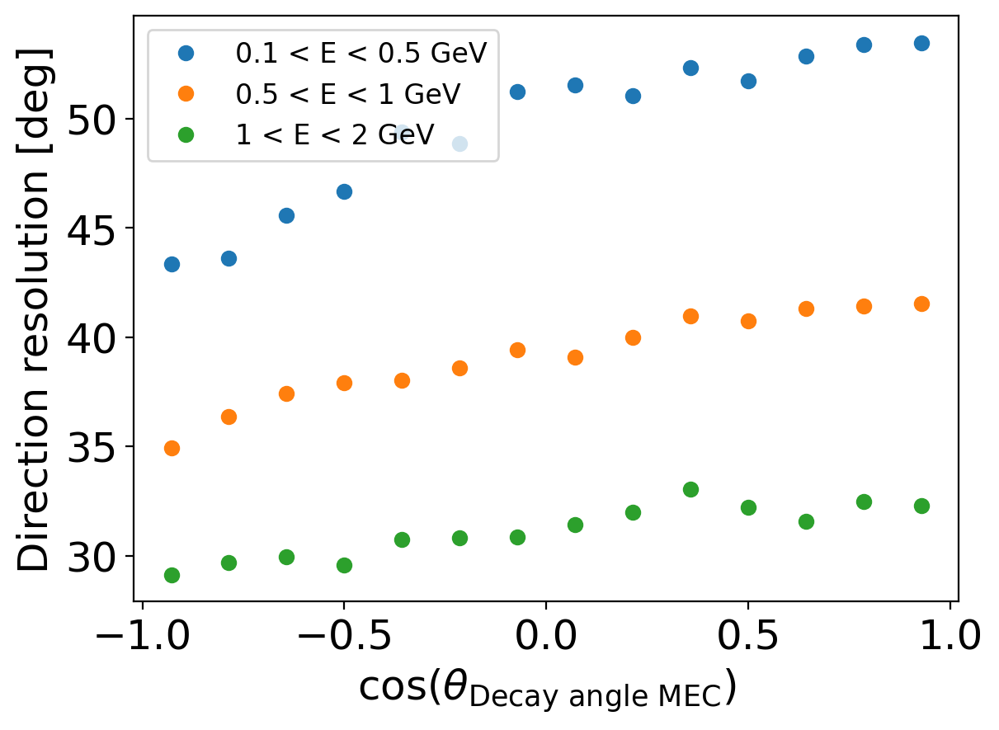

In [3]:
# 

from scipy.stats import binned_statistic

mec = cafs.data.filter(pl.col('DecayAngMEC') >= -1, pl.col('reco_direc').abs() < 1).with_columns(
    direc_res = (pl.col('direc_true').arccos() - pl.col('reco_direc').arccos()) * 180/np.pi,
    Eres = pl.col('reco_E') - pl.col('nu_E')
)

angBins = np.linspace(-1, 1, 15)
angCenters = (angBins[1:] + angBins[:-1])/2

#Plotting the direction reco as a function of energy
# Ebins = np.linspace(0, 2, 40)


for Erange in ([0.1, 0.5], [0.5, 1], [1, 2]):
    selected = mec.filter(
        pl.col('nu_E') > Erange[0],
        pl.col('nu_E') < Erange[1]
    )
    std = binned_statistic(selected['DecayAngMEC'].cos(), selected['direc_res'], statistic='std', bins=angBins).statistic
    plt.errorbar(angCenters, std, fmt='o', label=f'{Erange[0]} < E < {Erange[1]} GeV')
plt.xlabel(r'$\cos(\theta_{\rm Decay\ angle\ MEC})$')
plt.ylabel('Direction resolution [deg]')
plt.legend(fontsize=12)
plt.tight_layout()

# Printing all the available systematics

In [4]:
systs

╔══════════════════════════════════════════════════════════╗
║           📊 Systematic Configuration                    ║
╚══════════════════════════════════════════════════════════╝

┌─ 🔧 Provider: GENIEReWeight_DUNE_v2
│  (54 systematics)
│
│  ├── ✓ AhtBY
│  ├── ✓ BhtBY
│  ├── ✓ CV1uBY
│  ├── ✓ CV2uBY
│  ├── ✓ EtaNCEL
│  ├── ✓ FrAbs_N
│  ├── ✓ FrAbs_pi
│  ├── ✓ FrCEx_N
│  ├── ✓ FrCEx_pi
│  ├── ✓ FrInel_N
│  ├── ✓ FrInel_pi
│  ├── ✓ FrPiProd_N
│  ├── ✓ FrPiProd_pi
│  ├── ✓ MFP_N
│  ├── ✓ MFP_pi
│  ├── ✓ MaCCRES
│  ├── ✓ MaNCEL
│  ├── ✓ MaNCRES
│  ├── ✓ MvCCRES
│  ├── ✓ MvNCRES
│  ├── ✓ NonRESBGvbarnCC1pi
│  ├── ✓ NonRESBGvbarnCC2pi
│  ├── ✓ NonRESBGvbarnNC1pi
│  ├── ✓ NonRESBGvbarnNC2pi
│  ├── ✓ NonRESBGvbarpCC1pi
│  ├── ✓ NonRESBGvbarpCC2pi
│  ├── ✓ NonRESBGvbarpNC1pi
│  ├── ✓ NonRESBGvbarpNC2pi
│  ├── ✓ NonRESBGvnCC1pi
│  ├── ✓ NonRESBGvnCC2pi
│  ├── ✓ NonRESBGvnNC1pi
│  ├── ✓ NonRESBGvnNC2pi
│  ├── ✓ NonRESBGvpCC1pi
│  ├── ✓ NonRESBGvpCC2pi
│  ├── ✓ NonRESBGvpNC1pi
│  ├── ✓ NonRESBGvpNC2pi
│  ├── ✓ RDecBR1eta
│  ├── ✓ RDecBR1gamma
│  ├── ✓ Theta_Delta2Npi
│  ├── ✓ VecFFCCQEshape
│  ├── ✓ ZExpA1CCQE
│  ├── ✓ ZExpA2CCQE
│  ├── ✓ ZExpA3CCQE
│  ├── ✓ ZExpA4CCQE
│  ├── ✓ DecayAng2MEC
│  ├── ✓ DecayAngMEC
│  ├── ✓ DecayAngMECVariationResponse
│  ├── ✓ EnergyDependence_CCMEC
│  ├── ✓ FracDelta_CCMEC
│  ├── ✓ FracPN_CCMEC
│  ├── ✓ XSecShape_CCMEC
│  ├── ✓ XSecShape_CCMEC_Empirical
│  ├── ✓ XSecShape_CCMEC_Martini
│  └── ✓ Fakedial
│
┌─ 🔧 Provider: zexpansion_weighter_toolconfig
│  (4 systematics)
│
│  ├── ✓ b1
│  ├── ✓ b2
│  ├── ✓ b3
│  └── ✓ b4
│
┌─ 🔧 Provider: MiscInteractionSysts_DUNE_TDR_FakeData
│  (4 systematics)
│
│  ├── ✓ C12ToAr40_2p2hScaling_nu
│  ├── ✓ C12ToAr40_2p2hScaling_nubar
│  ├── ✓ nuenuebar_xsec_ratio
│  └── ✓ nuenumu_xsec_ratio
│
┌─ 🔧 Provider: ResIso_ResonanceIsolation
│  (4 systematics)
│
│  ├── ✓ MaRes_ResCode0
│  ├── ✓ MaRes_ResCode1
│  ├── ✓ MvRes_ResCode0
│  └── ✓ MvRes_ResCode1
│
┌─ 🔧 Provider: WSRWEngine
│  (2 systematics)
│
│  ├── ✓ nucleus_radius
│  └── ✓ surface_thickness
│
────────────────────────────────────────────────────────────
📈 Summary: 5 providers, 68 total systematics

In [ ]:
# old_systs = systs = SystConfig("systs.fcl")
# yaml_str = systs.to_oscillation_yaml(
#         output_file='oscillation_all_systematics.yaml',
#         sample_names=["ND_*", "FD_*", "ATM"],
#         error=1.0,
#         mcmc_step_scale=0.4
#     )

YAML configuration saved to oscillation_all_systematics.yaml


# Defining some modes and filters

In [43]:
modes = ["CCQE",
  "CC1Kaon",
  "CCDIS",
  "CCRES",
  "CCCOH",
  "CCDiff",
  "CCNuEl",
  "CCIMD",
  "CCAnuGam",
  "CCMEC",
  "CCCOHEL",
  "CCIBD",
  "CCGlRES",
  "CCIMDAnn"
]


nue_filter = pl.col('reco_pdg') == Flavor.NuE
numu_filter = pl.col('reco_pdg') == Flavor.NuMu
ccqe_filter = pl.col('mode') == modes.index("CCQE")
ccres_filter = pl.col('mode') == modes.index("CCRES")

In [49]:
qe = cafs.data.filter(ccqe_filter)
record = qe[0]
print_fsi(record)


Pre-FSI particles (5 columns)
  [0] E=1.138, Name=n, Pdg=2112, Px=0.4345, Py=-0.05825, Pz=-0.4692

Post-FSI particles (5 columns)
  [0] E=0.002249, Name=gamma, Pdg=22, Px=-0.001848, Py=0.0009862, Pz=-0.0008193
  [1] E=0.1942, Name=e+, Pdg=-11, Px=0.01742, Py=-0.01824, Pz=0.1925
  [2] E=0.9669, Name=p, Pdg=2212, Px=-0.02628, Py=0.06266, Pz=-0.2233
  [3] E=1.09, Name=n, Pdg=2112, Px=0.4201, Py=-0.1159, Pz=-0.3397


# Demonstrating some 2d plots

/Users/pgranger/cernbox/systematics/systs.py:775: RuntimeWarning: invalid value encountered in divide
  
/Users/pgranger/cernbox/systematics/systs.py:776: RuntimeWarning: invalid value encountered in divide
  # Remove x-tick labels from top plot


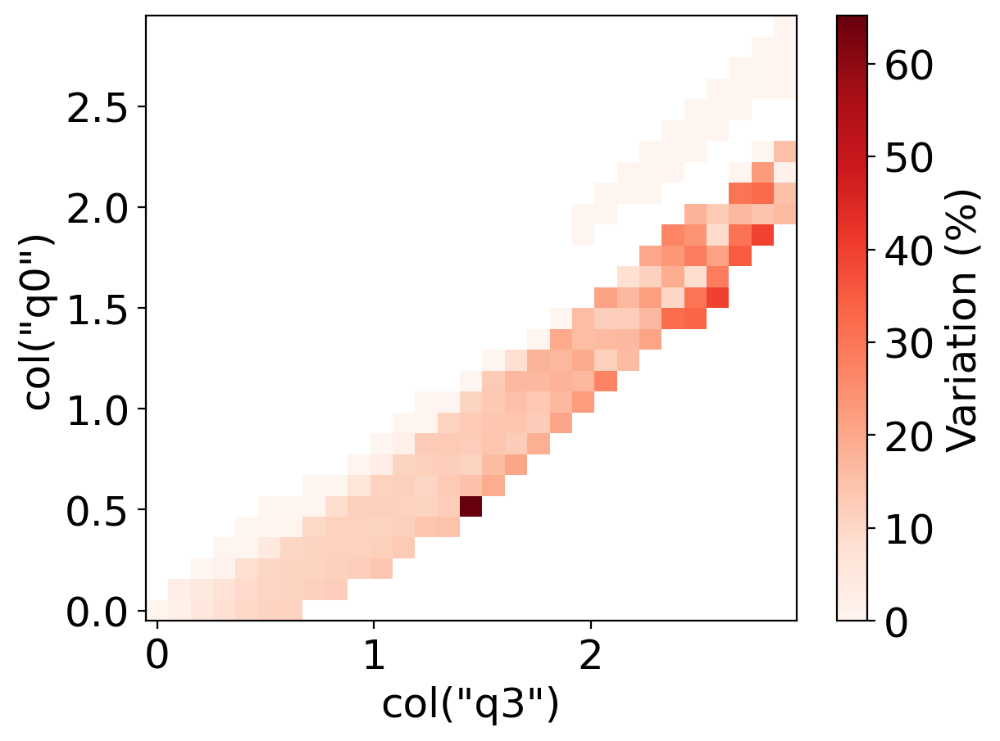

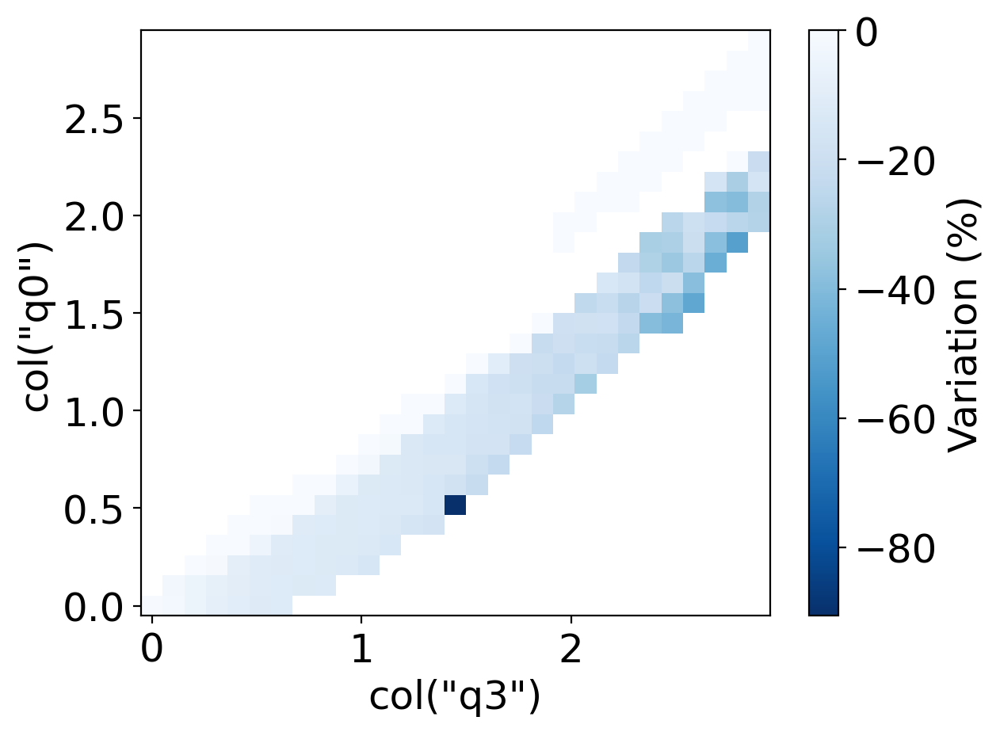

In [33]:
analyzer.plot_2d_fractional_variation(['b1', 'b2', 'b3','b4'], pl.col('q3'), np.linspace(0, 3, 30), pl.col('q0'), np.linspace(0, 3, 30), numu_filter & ccqe_filter)
analyzer.plot_2d_fractional_variation(['b1', 'b2', 'b3','b4'], pl.col('q3'), np.linspace(0, 3, 30), pl.col('q0'), np.linspace(0, 3, 30), numu_filter & ccqe_filter, which="down")
# analyzer.plot_2d_fractional_variation('E2p2h_A_nu', pl.col('q0'), np.linspace(0, 2, 30), pl.col('q3'), np.linspace(0, 2, 20), numu_filter, which="down")


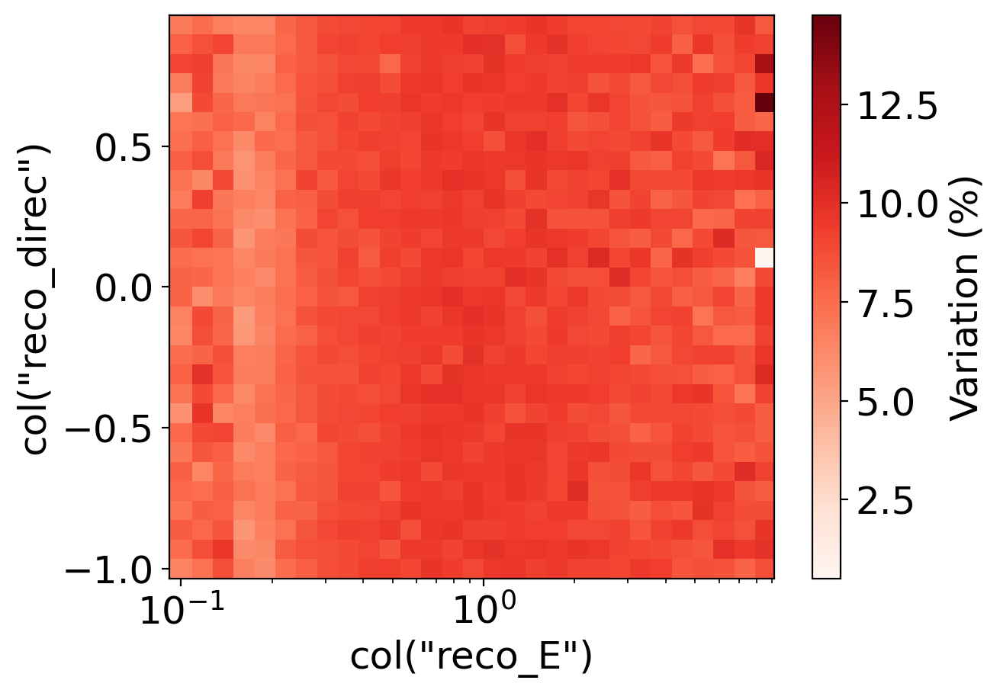

In [34]:
analyzer.plot_2d_fractional_variation(['b1', 'b2', 'b3','b4'], pl.col('reco_E'), np.logspace(-1, 1, 30), pl.col('reco_direc'), np.linspace(-1, 1, 30), numu_filter & ccqe_filter)
plt.xscale('log')


# Demonstrating 1d variation plot

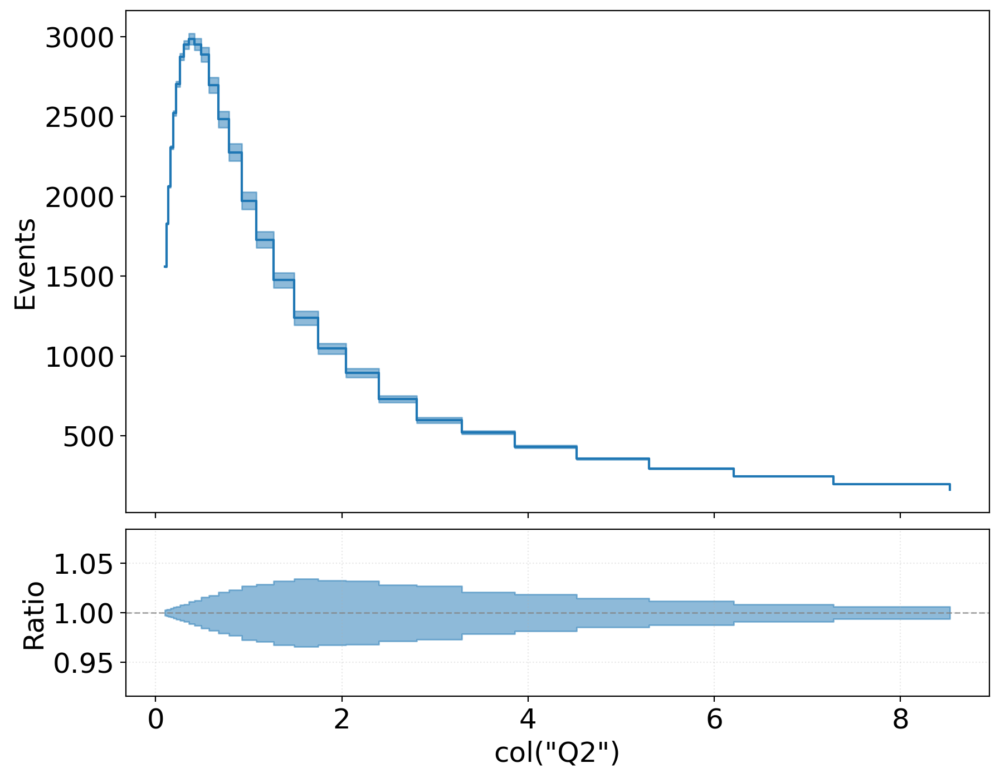

In [23]:
analyzer.plot_1sigma_band(['NonRESBGvnCC2pi'], pl.col('Q2'), np.logspace(-1, 1, 30))

In [ ]:
systs_groups = {
    "CCQE": ['b1', 'b2', 'b3', 'b4', 'VecFFCCQEshape'],
    "BodekYang": ['AhtBY', 'BhtBY', 'CV1uBY', 'CV2uBY'],
    'FSI': ['FrAbs_N', 'FrAbs_pi', 'FrCEx_N', 'FrCEx_pi', 'FrInel_N', 'FrInel_pi', 'FrPiProd_N', 'FrPiProd_pi', 'MFP_N', 'MFP_pi'],
    'CCRES': ['MaRes_ResCode0', 'MaRes_ResCode1', 'MvRes_ResCode0', 'MvRes_ResCode1', 'RDecBR1eta', 'RDecBR1gamma', 'Theta_Delta2Npi'],
    'NC': ['MaNCRES', 'MvNCRES', 'MaNCEL', 'EtaNCEL'],
    'MEC': ['EnergyDependence_CCMEC', 'FracDelta_CCMEC', 'FracPN_CCMEC', 'XSecShape_CCMEC', 'XSecShape_CCMEC_Empirical', 'XSecShape_CCMEC_Martini', 'C12ToAr40_2p2hScaling_nu', 'C12ToAr40_2p2hScaling_nubar'], #DecayAngMECVariationResponse
    # 'MEC': ['EnergyDependence_CCMEC', 'FracDelta_CCMEC', 'FracPN_CCMEC', 'XSecShape_CCMEC', 'XSecShape_CCMEC_Empirical', 'XSecShape_CCMEC_Martini', 'C12ToAr40_2p2hScaling_nu', 'C12ToAr40_2p2hScaling_nubar'], #DecayAngMECVariationResponse
    'CCSIS': ['NonRESBGvbarnCC1pi', 'NonRESBGvbarnCC2pi', 'NonRESBGvbarpCC1pi', 'NonRESBGvbarpCC2pi', 'NonRESBGvnCC1pi', 'NonRESBGvnCC2pi', 'NonRESBGvpCC1pi', 'NonRESBGvpCC2pi'],
    'NCSIS': ['NonRESBGvbarnNC1pi', 'NonRESBGvbarnNC2pi', 'NonRESBGvbarpNC1pi', 'NonRESBGvbarpNC2pi', 'NonRESBGvnNC1pi', 'NonRESBGvnNC2pi', 'NonRESBGvpNC1pi', 'NonRESBGvpNC2pi'],
    "Others": ['nucleus_radius', 'surface_thickness', 'nuenuebar_xsec_ratio', 'nuenumu_xsec_ratio']
}

# Producing standardized series of plots for all the dials

In [26]:
# Example: Create a 2x3 grid of plots, each with ratio panels
all_systs = systs.get_all_systs()

for syst in tqdm(all_systs):  # Test with first systematic
    local_systs = [syst]
    
    # Create figure with 4 rows (2 main + 2 ratio) and 3 columns
    fig = plt.figure(figsize=(20, 10), constrained_layout=True)
    gs = fig.add_gridspec(4, 3, height_ratios=[3, 1, 3, 1], hspace=0)
    
    # Create axes pairs for each plot
    ax_00_main = fig.add_subplot(gs[0, 0])
    ax_00_ratio = fig.add_subplot(gs[1, 0], sharex=ax_00_main)
    
    ax_01_main = fig.add_subplot(gs[0, 1])
    ax_01_ratio = fig.add_subplot(gs[1, 1], sharex=ax_01_main)
    
    ax_02_main = fig.add_subplot(gs[0, 2])
    ax_02_ratio = fig.add_subplot(gs[1, 2], sharex=ax_02_main)
    
    ax_10_main = fig.add_subplot(gs[2, 0])
    ax_10_ratio = fig.add_subplot(gs[3, 0], sharex=ax_10_main)
    
    ax_11_main = fig.add_subplot(gs[2, 1])
    ax_11_ratio = fig.add_subplot(gs[3, 1], sharex=ax_11_main)
    
    ax_12_main = fig.add_subplot(gs[2, 2])
    ax_12_ratio = fig.add_subplot(gs[3, 2], sharex=ax_12_main)
    
    # Plot 1: True Energy
    fig_en = MultiPlot(analyzer, bin_var=pl.col('Ev'), bins=np.logspace(-1, 1, 50), ax=(ax_00_main, ax_00_ratio))
    fig_en.add_syst_band(local_systs, r'Reco $\nu_e$', nue_filter)
    fig_en.add_syst_band(local_systs, r'Reco $\nu_\mu$', numu_filter)
    fig_en.legend()
    ax_00_main.set_xscale('log')
    ax_00_ratio.set_xlabel('True Energy (GeV)')
    
    # Plot 2: Reconstructed Hadronic Energy
    fig_en = MultiPlot(analyzer, bin_var=pl.col('reco_Ehad'), bins=np.logspace(-1, 1, 50), ax=(ax_01_main, ax_01_ratio))
    fig_en.add_syst_band(local_systs, r'Reco $\nu_e$', nue_filter)
    fig_en.add_syst_band(local_systs, r'Reco $\nu_\mu$', numu_filter)
    fig_en.legend()
    ax_01_main.set_xscale('log')
    ax_01_ratio.set_xlabel('Reconstructed Hadronic Energy (GeV)')
    
    # Plot 3: Reconstructed Leptonic Energy
    fig_en = MultiPlot(analyzer, bin_var=pl.col('reco_Elep'), bins=np.logspace(-1, 1, 50), ax=(ax_02_main, ax_02_ratio))
    fig_en.add_syst_band(local_systs, r'Reco $\nu_e$', nue_filter)
    fig_en.add_syst_band(local_systs, r'Reco $\nu_\mu$', numu_filter)
    fig_en.legend()
    ax_02_main.set_xscale('log')
    ax_02_ratio.set_xlabel('Reconstructed Leptonic Energy (GeV)')
    
    # Plot 4: Reconstructed Total Energy
    fig_dir = MultiPlot(analyzer, bin_var=pl.col('reco_E'), bins=np.logspace(-1, 1, 50), ax=(ax_10_main, ax_10_ratio))
    fig_dir.add_syst_band(local_systs, r'Reco $\nu_e$', nue_filter)
    fig_dir.add_syst_band(local_systs, r'Reco $\nu_\mu$', numu_filter)
    fig_dir.legend()
    ax_10_main.set_xscale('log')
    ax_10_ratio.set_xlabel(r'Reconstructed energy (GeV)')
    
    # Plot 5: Reconstructed Direction
    fig_dir = MultiPlot(analyzer, bin_var=pl.col('reco_direc'), bins=np.linspace(-1, 1, 50), ax=(ax_11_main, ax_11_ratio))
    fig_dir.add_syst_band(local_systs, r'Reco $\nu_e$', nue_filter)
    fig_dir.add_syst_band(local_systs, r'Reco $\nu_\mu$', numu_filter)
    fig_dir.legend()
    ax_11_ratio.set_xlabel(r'Reconstructed $\cos\theta_y$')
    
    # Plot 6: True Direction
    fig_dir = MultiPlot(analyzer, bin_var=pl.col('direc_true'), bins=np.linspace(-1, 1, 50), ax=(ax_12_main, ax_12_ratio))
    fig_dir.add_syst_band(local_systs, r'Reco $\nu_e$', nue_filter)
    fig_dir.add_syst_band(local_systs, r'Reco $\nu_\mu$', numu_filter)
    fig_dir.legend()
    ax_12_ratio.set_xlabel(r'True $\cos\theta_y$')
    
    fig.suptitle(f'Systematic: {syst.name}', fontsize=16)
    fig.savefig(f'systematic_plots/{syst.name}_syst_band.png', bbox_inches='tight')
    fig.savefig(f'systematic_plots/{syst.name}_syst_band.pdf', bbox_inches='tight')
    plt.close(fig)
    # break  # Remove this to process all systematics

 56%|█████▌    | 38/68 [01:48<01:28,  2.96s/it]

No reference index (0) found in paramVariations for syst Theta_Delta2Npi
No reference index (0) found in paramVariations for syst Theta_Delta2Npi
No reference index (0) found in paramVariations for syst Theta_Delta2Npi
No reference index (0) found in paramVariations for syst Theta_Delta2Npi
No reference index (0) found in paramVariations for syst Theta_Delta2Npi
No reference index (0) found in paramVariations for syst Theta_Delta2Npi
No reference index (0) found in paramVariations for syst Theta_Delta2Npi
No reference index (0) found in paramVariations for syst Theta_Delta2Npi
No reference index (0) found in paramVariations for syst Theta_Delta2Npi
No reference index (0) found in paramVariations for syst Theta_Delta2Npi
No reference index (0) found in paramVariations for syst Theta_Delta2Npi
No reference index (0) found in paramVariations for syst Theta_Delta2Npi


 57%|█████▋    | 39/68 [01:51<01:23,  2.89s/it]

No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape


 65%|██████▍   | 44/68 [02:05<01:09,  2.90s/it]

No reference index (0) found in paramVariations for syst DecayAng2MEC
No reference index (0) found in paramVariations for syst DecayAng2MEC
No reference index (0) found in paramVariations for syst DecayAng2MEC
No reference index (0) found in paramVariations for syst DecayAng2MEC
No reference index (0) found in paramVariations for syst DecayAng2MEC
No reference index (0) found in paramVariations for syst DecayAng2MEC
No reference index (0) found in paramVariations for syst DecayAng2MEC
No reference index (0) found in paramVariations for syst DecayAng2MEC
No reference index (0) found in paramVariations for syst DecayAng2MEC
No reference index (0) found in paramVariations for syst DecayAng2MEC
No reference index (0) found in paramVariations for syst DecayAng2MEC
No reference index (0) found in paramVariations for syst DecayAng2MEC


 68%|██████▊   | 46/68 [02:10<01:00,  2.77s/it]

 69%|██████▉   | 47/68 [02:13<00:57,  2.72s/it]

 71%|███████   | 48/68 [02:16<00:53,  2.69s/it]

No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC


 72%|███████▏  | 49/68 [02:18<00:50,  2.66s/it]

No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC


 74%|███████▎  | 50/68 [02:21<00:47,  2.66s/it]

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:1496: RuntimeWarning: invalid value encountered in subtract
  a = op(a[slice1], a[slice2])


 75%|███████▌  | 51/68 [02:23<00:44,  2.63s/it]

 76%|███████▋  | 52/68 [02:26<00:43,  2.70s/it]

 78%|███████▊  | 53/68 [02:29<00:40,  2.71s/it]

 85%|████████▌ | 58/68 [02:43<00:27,  2.79s/it]

 87%|████████▋ | 59/68 [02:46<00:25,  2.82s/it]

 88%|████████▊ | 60/68 [02:49<00:22,  2.83s/it]

 90%|████████▉ | 61/68 [02:52<00:19,  2.85s/it]

<string>:56: RuntimeWarning: invalid value encountered in divide
<string>:57: RuntimeWarning: divide by zero encountered in divide


 91%|█████████ | 62/68 [02:55<00:16,  2.82s/it]

No reference index (0) found in paramVariations for syst MaRes_ResCode0
No reference index (0) found in paramVariations for syst MaRes_ResCode0
No reference index (0) found in paramVariations for syst MaRes_ResCode0
No reference index (0) found in paramVariations for syst MaRes_ResCode0
No reference index (0) found in paramVariations for syst MaRes_ResCode0
No reference index (0) found in paramVariations for syst MaRes_ResCode0
No reference index (0) found in paramVariations for syst MaRes_ResCode0
No reference index (0) found in paramVariations for syst MaRes_ResCode0
No reference index (0) found in paramVariations for syst MaRes_ResCode0
No reference index (0) found in paramVariations for syst MaRes_ResCode0
No reference index (0) found in paramVariations for syst MaRes_ResCode0
No reference index (0) found in paramVariations for syst MaRes_ResCode0


 93%|█████████▎| 63/68 [02:58<00:14,  2.93s/it]

No reference index (0) found in paramVariations for syst MaRes_ResCode1
No reference index (0) found in paramVariations for syst MaRes_ResCode1
No reference index (0) found in paramVariations for syst MaRes_ResCode1
No reference index (0) found in paramVariations for syst MaRes_ResCode1
No reference index (0) found in paramVariations for syst MaRes_ResCode1
No reference index (0) found in paramVariations for syst MaRes_ResCode1
No reference index (0) found in paramVariations for syst MaRes_ResCode1
No reference index (0) found in paramVariations for syst MaRes_ResCode1
No reference index (0) found in paramVariations for syst MaRes_ResCode1
No reference index (0) found in paramVariations for syst MaRes_ResCode1
No reference index (0) found in paramVariations for syst MaRes_ResCode1
No reference index (0) found in paramVariations for syst MaRes_ResCode1


 94%|█████████▍| 64/68 [03:01<00:11,  2.96s/it]

No reference index (0) found in paramVariations for syst MvRes_ResCode0
No reference index (0) found in paramVariations for syst MvRes_ResCode0
No reference index (0) found in paramVariations for syst MvRes_ResCode0
No reference index (0) found in paramVariations for syst MvRes_ResCode0
No reference index (0) found in paramVariations for syst MvRes_ResCode0
No reference index (0) found in paramVariations for syst MvRes_ResCode0
No reference index (0) found in paramVariations for syst MvRes_ResCode0
No reference index (0) found in paramVariations for syst MvRes_ResCode0
No reference index (0) found in paramVariations for syst MvRes_ResCode0
No reference index (0) found in paramVariations for syst MvRes_ResCode0
No reference index (0) found in paramVariations for syst MvRes_ResCode0
No reference index (0) found in paramVariations for syst MvRes_ResCode0


 96%|█████████▌| 65/68 [03:04<00:09,  3.01s/it]

No reference index (0) found in paramVariations for syst MvRes_ResCode1
No reference index (0) found in paramVariations for syst MvRes_ResCode1
No reference index (0) found in paramVariations for syst MvRes_ResCode1
No reference index (0) found in paramVariations for syst MvRes_ResCode1
No reference index (0) found in paramVariations for syst MvRes_ResCode1
No reference index (0) found in paramVariations for syst MvRes_ResCode1
No reference index (0) found in paramVariations for syst MvRes_ResCode1
No reference index (0) found in paramVariations for syst MvRes_ResCode1
No reference index (0) found in paramVariations for syst MvRes_ResCode1
No reference index (0) found in paramVariations for syst MvRes_ResCode1
No reference index (0) found in paramVariations for syst MvRes_ResCode1
No reference index (0) found in paramVariations for syst MvRes_ResCode1


 97%|█████████▋| 66/68 [03:07<00:06,  3.02s/it]

No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst nucleus_radius


 99%|█████████▊| 67/68 [03:12<00:03,  3.49s/it]

No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst surface_thickness


100%|██████████| 68/68 [03:15<00:00,  2.88s/it]


No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst VecFFCCQEshape
No reference index (0) found in paramVariations for syst MaRes_ResCode0
No reference index (0) found in paramVariations for syst MaRes_R

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:1496: RuntimeWarning: invalid value encountered in subtract
  a = op(a[slice1], a[slice2])


No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC
No reference index (0) found in paramVariations for syst FracDelta_CCMEC
No reference index (0) found in paramVariations for syst FracPN_CCMEC

<string>:56: RuntimeWarning: divide by zero encountered in divide
<string>:57: RuntimeWarning: divide by zero encountered in divide


No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariations for syst surface_thickness
No reference index (0) found in paramVariations for syst nucleus_radius
No reference index (0) found in paramVariation

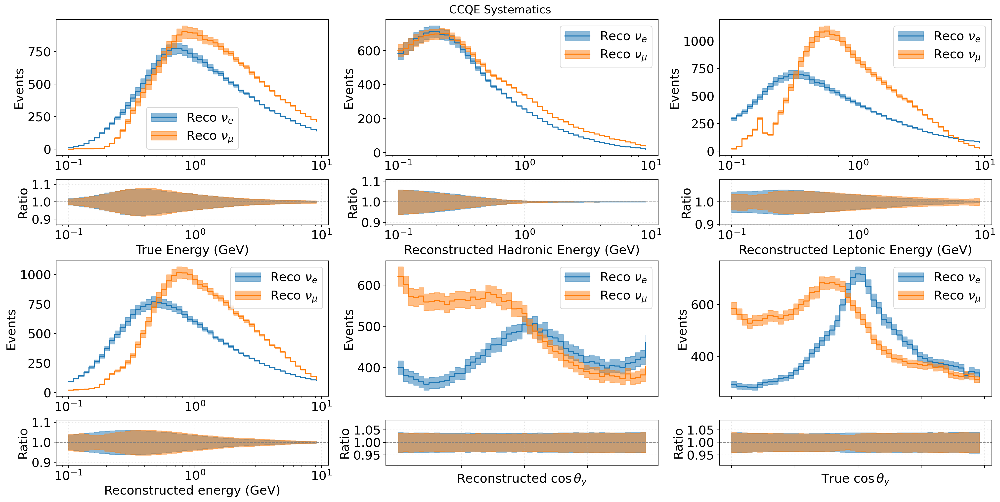

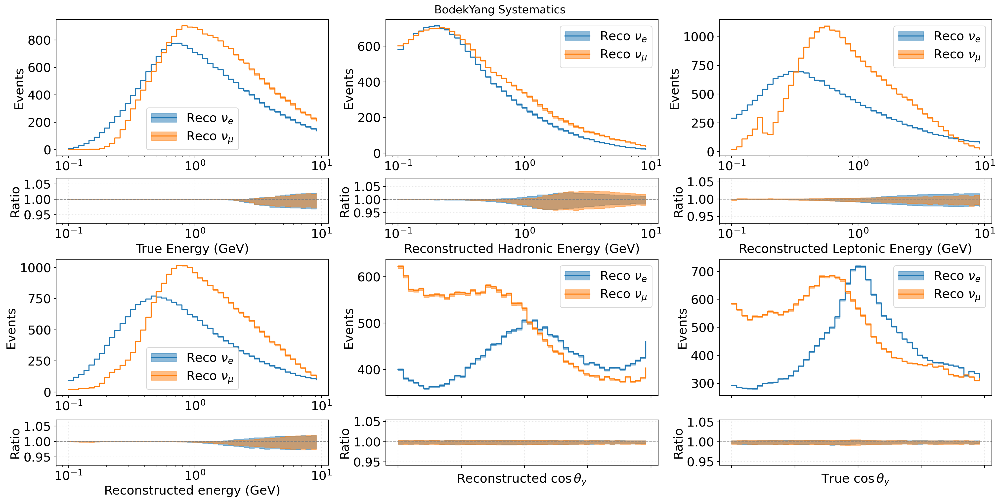

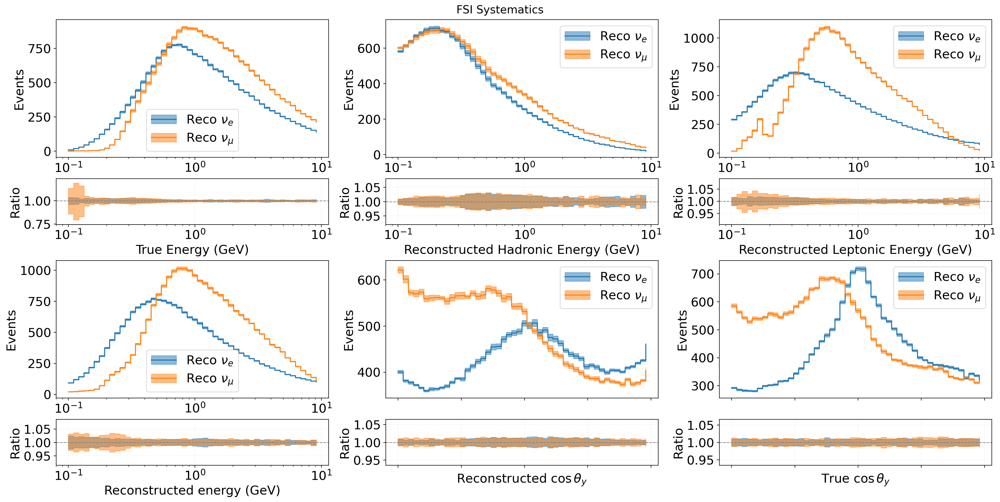

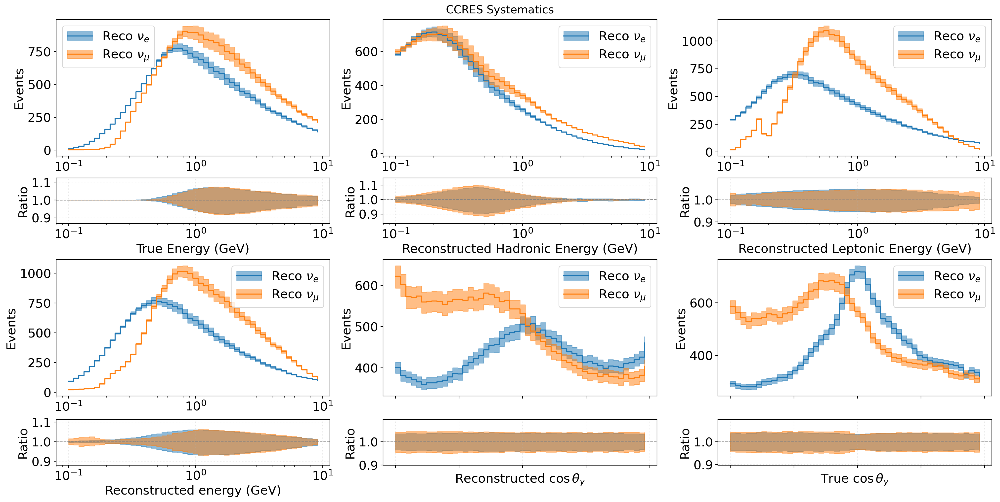

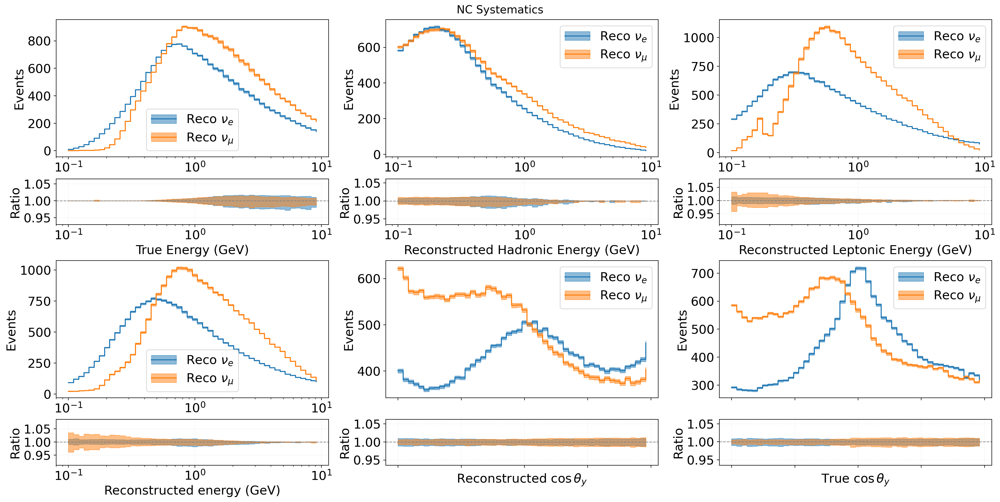

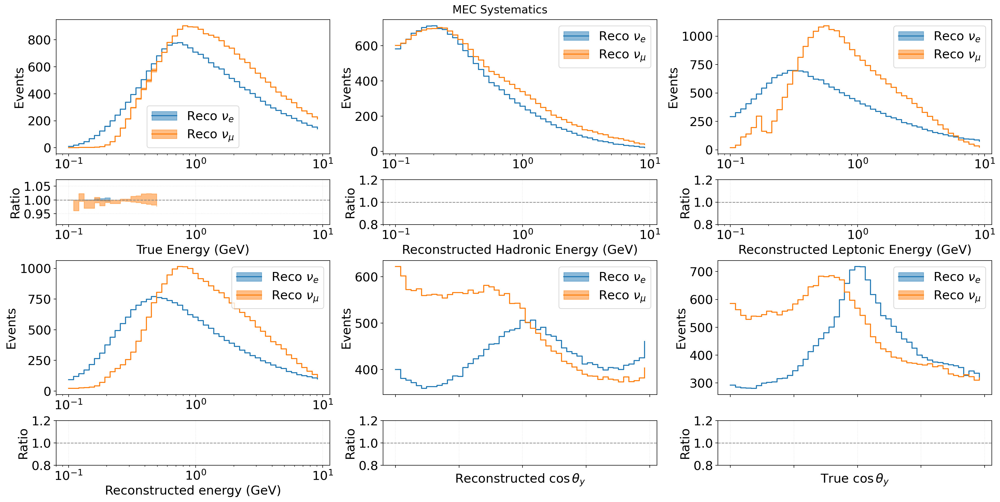

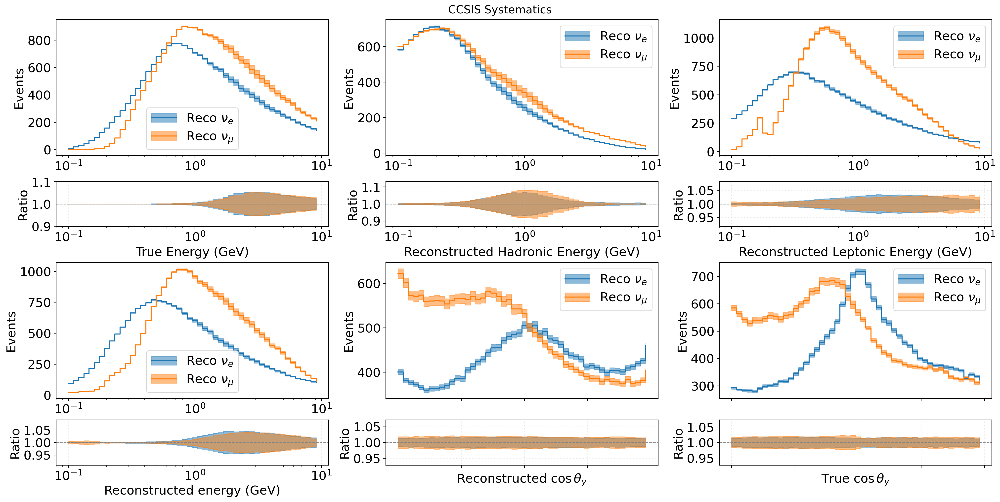

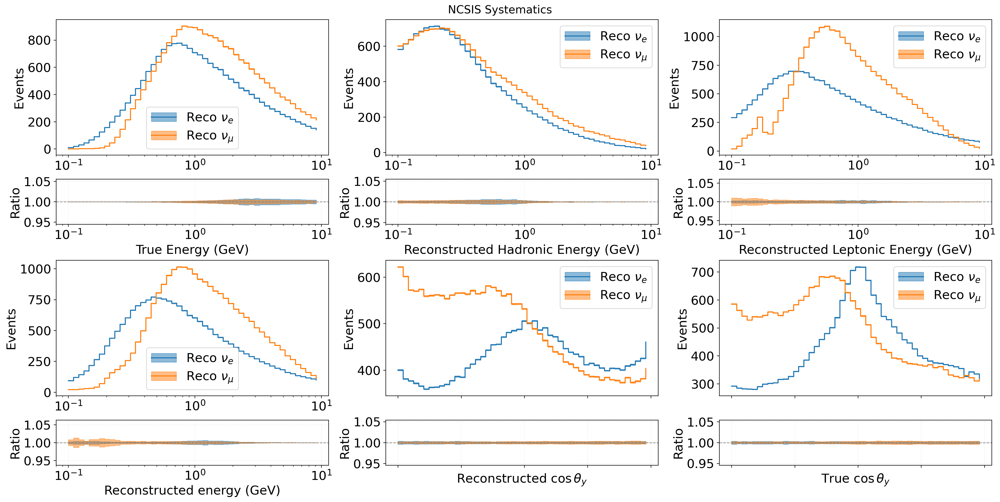

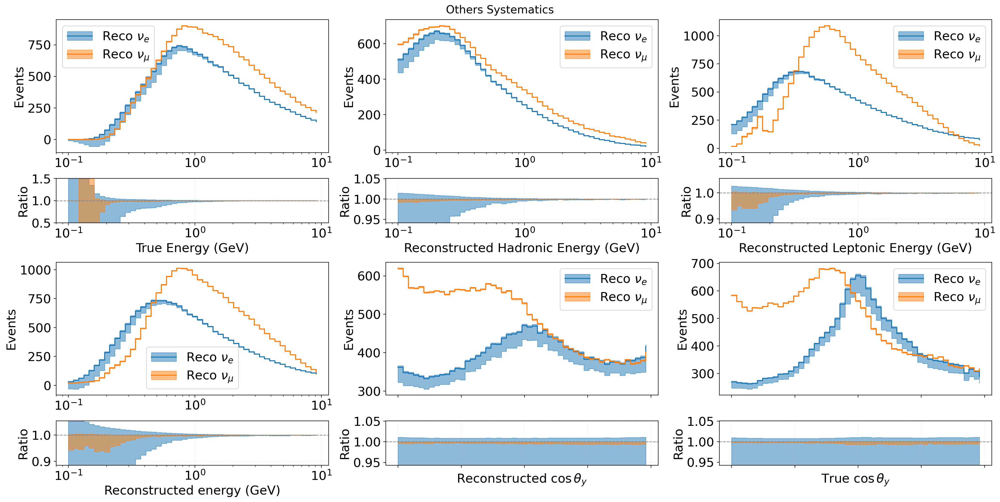

In [ ]:
# Example: Create a 2x3 grid of plots, each with ratio panels
all_systs = systs.get_all_systs()

for g in systs_groups:

    local_systs = systs_groups[g]

    # Create figure with 4 rows (2 main + 2 ratio) and 3 columns
    fig = plt.figure(figsize=(20, 10), constrained_layout=True)
    gs = fig.add_gridspec(4, 3, height_ratios=[3, 1, 3, 1], hspace=0)

    # Create axes pairs for each plot
    ax_00_main = fig.add_subplot(gs[0, 0])
    ax_00_ratio = fig.add_subplot(gs[1, 0], sharex=ax_00_main)

    ax_01_main = fig.add_subplot(gs[0, 1])
    ax_01_ratio = fig.add_subplot(gs[1, 1], sharex=ax_01_main)

    ax_02_main = fig.add_subplot(gs[0, 2])
    ax_02_ratio = fig.add_subplot(gs[1, 2], sharex=ax_02_main)

    ax_10_main = fig.add_subplot(gs[2, 0])
    ax_10_ratio = fig.add_subplot(gs[3, 0], sharex=ax_10_main)

    ax_11_main = fig.add_subplot(gs[2, 1])
    ax_11_ratio = fig.add_subplot(gs[3, 1], sharex=ax_11_main)

    ax_12_main = fig.add_subplot(gs[2, 2])
    ax_12_ratio = fig.add_subplot(gs[3, 2], sharex=ax_12_main)
    
    # Plot 1: True Energy
    fig_en = MultiPlot(analyzer, bin_var=pl.col('Ev'), bins=np.logspace(-1, 1, 50), ax=(ax_00_main, ax_00_ratio))
    fig_en.add_syst_band(local_systs, r'Reco $\nu_e$', nue_filter)
    fig_en.add_syst_band(local_systs, r'Reco $\nu_\mu$', numu_filter)
    fig_en.legend()
    ax_00_main.set_xscale('log')
    ax_00_ratio.set_xlabel('True Energy (GeV)')

    # Plot 2: Reconstructed Hadronic Energy
    fig_en = MultiPlot(analyzer, bin_var=pl.col('reco_Ehad'), bins=np.logspace(-1, 1, 50), ax=(ax_01_main, ax_01_ratio))
    fig_en.add_syst_band(local_systs, r'Reco $\nu_e$', nue_filter)
    fig_en.add_syst_band(local_systs, r'Reco $\nu_\mu$', numu_filter)
    fig_en.legend()
    ax_01_main.set_xscale('log')
    ax_01_ratio.set_xlabel('Reconstructed Hadronic Energy (GeV)')

    # Plot 3: Reconstructed Leptonic Energy
    fig_en = MultiPlot(analyzer, bin_var=pl.col('reco_Elep'), bins=np.logspace(-1, 1, 50), ax=(ax_02_main, ax_02_ratio))
    fig_en.add_syst_band(local_systs, r'Reco $\nu_e$', nue_filter)
    fig_en.add_syst_band(local_systs, r'Reco $\nu_\mu$', numu_filter)
    fig_en.legend()
    ax_02_main.set_xscale('log')
    ax_02_ratio.set_xlabel('Reconstructed Leptonic Energy (GeV)')

    # Plot 4: Reconstructed Total Energy
    fig_dir = MultiPlot(analyzer, bin_var=pl.col('reco_E'), bins=np.logspace(-1, 1, 50), ax=(ax_10_main, ax_10_ratio))
    fig_dir.add_syst_band(local_systs, r'Reco $\nu_e$', nue_filter)
    fig_dir.add_syst_band(local_systs, r'Reco $\nu_\mu$', numu_filter)
    fig_dir.legend()
    ax_10_main.set_xscale('log')
    ax_10_ratio.set_xlabel(r'Reconstructed energy (GeV)')

    # Plot 5: Reconstructed Direction
    fig_dir = MultiPlot(analyzer, bin_var=pl.col('reco_direc'), bins=np.linspace(-1, 1, 50), ax=(ax_11_main, ax_11_ratio))
    fig_dir.add_syst_band(local_systs, r'Reco $\nu_e$', nue_filter)
    fig_dir.add_syst_band(local_systs, r'Reco $\nu_\mu$', numu_filter)
    fig_dir.legend()
    ax_11_ratio.set_xlabel(r'Reconstructed $\cos\theta_y$')

    # Plot 6: True Direction
    fig_dir = MultiPlot(analyzer, bin_var=pl.col('direc_true'), bins=np.linspace(-1, 1, 50), ax=(ax_12_main, ax_12_ratio))
    fig_dir.add_syst_band(local_systs, r'Reco $\nu_e$', nue_filter)
    fig_dir.add_syst_band(local_systs, r'Reco $\nu_\mu$', numu_filter)
    fig_dir.legend()
    ax_12_ratio.set_xlabel(r'True $\cos\theta_y$')

    fig.suptitle(f'{g} Systematics', fontsize=16)
    fig.savefig(f'systematic_plots/{g}_syst_band.png', bbox_inches='tight')
    fig.savefig(f'systematic_plots/{g}_syst_band.pdf', bbox_inches='tight')
# plt.close(fig)
    # break  # Remove this to process all systematics

# Old things

In [38]:
# plt.hist(genie['Ecalo'], bins=Ebins, histtype='step');

def plot_1sigma_band_2d(syst_names, mask=True, bin_var_x='reco_E', bin_var_y='reco_direc', bins_x=np.logspace(-1, 1, 50), bins_y=np.linspace(-1, 1, 50)):
    fig, axs = plt.subplots(1, 2, figsize=(16, 6))
    sigma_up, sigma_down = None, None

    filtered_data = data.filter(mask)

    for syst_name in syst_names:
        syst = systs_header.filter(pl.col('name') == syst_name).row(0, named=True)
        variations = read_syst('./systs_new_cafs.root', syst).filter(filter_mask).filter(mask)
        ref, xedges, yedges = np.histogram2d(filtered_data[bin_var_x], filtered_data[bin_var_y], bins=[bins_x, bins_y], weights=variations[f'{syst["name"]}_3']*filtered_data['final_oscillated_w'])
        up_1sigma = np.histogram2d(filtered_data[bin_var_x], filtered_data[bin_var_y], bins=[bins_x, bins_y], weights=variations[f'{syst["name"]}_4']*filtered_data['final_oscillated_w'])
        down_1sigma = np.histogram2d(filtered_data[bin_var_x], filtered_data[bin_var_y], bins=[bins_x, bins_y], weights=variations[f'{syst["name"]}_2']*filtered_data['final_oscillated_w'])

        pos_1sigma = np.maximum(np.maximum(ref - up_1sigma[0], ref - down_1sigma[0]), 0)
        neg_1sigma = np.minimum(np.minimum(ref - up_1sigma[0], ref - down_1sigma[0]), 0)
        if sigma_up is None:
            sigma_up = pos_1sigma**2
            sigma_down = neg_1sigma**2
        else:
            sigma_up = sigma_up + pos_1sigma**2
            sigma_down = sigma_down + neg_1sigma**2

    # Plotting code for 2D histograms
    X, Y = np.meshgrid(xedges[:-1], yedges[:-1], indexing='ij')
    axs[0].pcolormesh(X, Y, 1+(sigma_up**0.5/ref), shading='auto', cmap='jet')
    # fig.colorbar(label='1 Sigma Up / Nominal', ax=axs[0])
    axs[0].set_xlabel(bin_var_x)
    axs[0].set_ylabel(bin_var_y)
    axs[0].set_title('1 Sigma Up Variation')
    axs[0].set_xscale('log')
    axs[1].pcolormesh(X, Y, 1-(sigma_down**0.5/ref), shading='auto', cmap='jet')
    # fig.colorbar(label='1 Sigma Down / Nominal', ax=axs[1])
    axs[1].set_xlabel(bin_var_x)
    axs[1].set_ylabel(bin_var_y)
    axs[1].set_title('1 Sigma Down Variation')
    axs[1].set_xscale('log')

    # fig.colorbar(label='Variation / Nominal', ax=axs, orientation='horizontal', fraction=0.05, pad=0.1)
    plt.tight_layout()

def plot_2d(systematic, systs_config, mask=True, bin_var_x='reco_E', bin_var_y='reco_direc', bins_x=np.logspace(-1, 1, 50), bins_y=np.linspace(-1, 1, 50)):
    fig, ax = plt.subplots(figsize=(8, 6))

    filtered_data = data.filter(mask)

    if type(systematic) is str:
        syst = systs_header.filter(pl.col('name') == systematic).row(0, named=True)
        variations = read_syst('./merged_new_systs.root', syst).filter(filter_mask).filter(mask)
    elif type(systematic) is pl.DataFrame:
        variations = systematic.filter(filter_mask).filter(mask)
        syst = {'name': variations.columns[0].rsplit('_', 1)[0]}  # Extract syst name from column name
    else:
        raise ValueError("systs must be a list of strings or DataFrames")
    
    syst_config = get_syst_from_config(systs_config, syst['name'])
    if 'paramVariations' not in syst_config:
        print(f"Warning: 'paramVariations' not found in syst config for syst {syst['name']}, skipping.")
        return
    if 0 in syst_config['paramVariations']:
        ref_idx = syst_config['paramVariations'].index(0)
    else:
        raise ValueError(f"No reference index (0) found in paramVariations for syst {syst['name']}")
    if 1 in syst_config['paramVariations']:
        p1s_idx = syst_config['paramVariations'].index(1)
    else:
        p1s_idx = ref_idx
        print(f"Warning: No +1 sigma index found in paramVariations for syst {syst['name']}, using reference index instead.")
    if -1 in syst_config['paramVariations']:
        m1s_idx = syst_config['paramVariations'].index(-1)
    else:
        m1s_idx = ref_idx
        print(f"Warning: No -1 sigma index found in paramVariations for syst {syst['name']}, using reference index instead.")

    ref, xedges, yedges = np.histogram2d(filtered_data[bin_var_x], filtered_data[bin_var_y], bins=[bins_x, bins_y], weights=variations[f'{syst["name"]}_{p1s_idx}']*filtered_data['final_oscillated_w'])

    # Plotting code for 2D histograms
    X, Y = np.meshgrid(xedges[:-1], yedges[:-1], indexing='ij')
    pcm = ax.pcolormesh(X, Y, ref, shading='auto', cmap='jet')
    fig.colorbar(pcm, label='Events', ax=ax)
    ax.set_xlabel(bin_var_x)
    ax.set_ylabel(bin_var_y)
    ax.set_title('Nominal Distribution')
    ax.set_xscale('log')

    plt.tight_layout()

In [39]:
nue_mask = data['reco_pdg'] == Flavor.NuE
numu_mask = data['reco_pdg'] == Flavor.NuMu

plot_1sigma_band_2d(['b1', 'b2', 'b3', 'b4'], nue_mask, bin_var_x='reco_E', bin_var_y='reco_direc', bins_x=np.logspace(-1, 1, 50), bins_y=np.linspace(-1, 1, 20))
plt.xscale('log')

plot_1sigma_band_2d(['b1', 'b2', 'b3', 'b4'], numu_mask, bin_var_x='reco_E', bin_var_y='reco_direc', bins_x=np.logspace(-1, 1, 50), bins_y=np.linspace(-1, 1, 20))
# plot_1sigma_band_2d(['b1', 'b2', 'b3', 'b4'], numu_mask, bin_var_x='Ev', bin_var_y='direc_true', bins_x=np.logspace(-1, 1, 100), bins_y=np.linspace(-1, 1, 100))
plt.xscale('log')

NameError: name 'data' is not defined

In [40]:
plot_2d('b1', systs_config, mask=nue_mask, bin_var_x='q0', bin_var_y='q3', bins_x=np.linspace(0, 1, 100), bins_y=np.linspace(0, 1, 100))
plt.xscale('linear')

NameError: name 'systs_config' is not defined

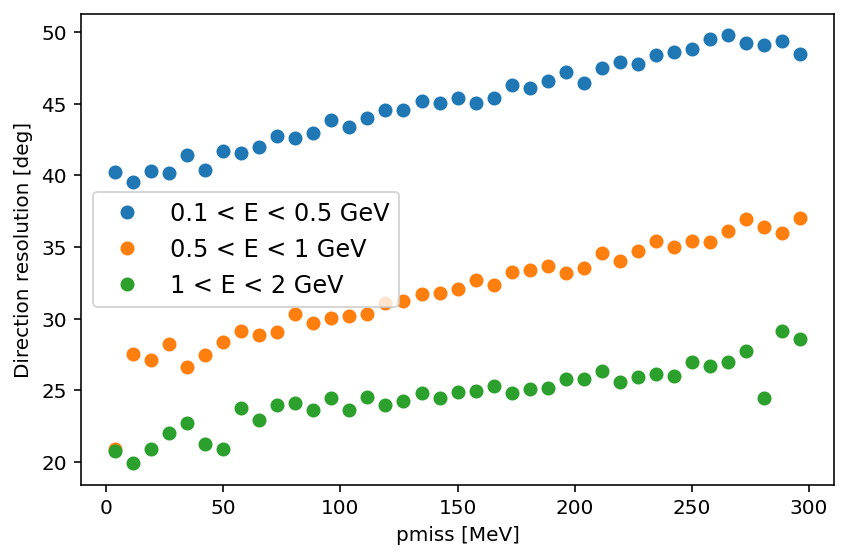

In [6]:
#Plotting the direction reco as a function of energy
# Ebins = np.linspace(0, 2, 40)
Pbins = np.linspace(0, 300, 40)
Ecenters = (Pbins[1:] + Pbins[:-1])/2
for Erange in ([0.1, 0.5], [0.5, 1], [1, 2]):
    selected = numu_ccqe.filter(
        pl.col('nu_E') > Erange[0],
        pl.col('nu_E') < Erange[1]
    )
    std = binned_statistic(selected['pmiss'], selected['direc_res'], statistic='std', bins=Pbins).statistic
    plt.errorbar(Ecenters, std, fmt='o', label=f'{Erange[0]} < E < {Erange[1]} GeV')
plt.xlabel('pmiss [MeV]')
plt.ylabel('Direction resolution [deg]')
plt.legend(fontsize=12)
plt.tight_layout()

Matched QE particle pairs: 868895


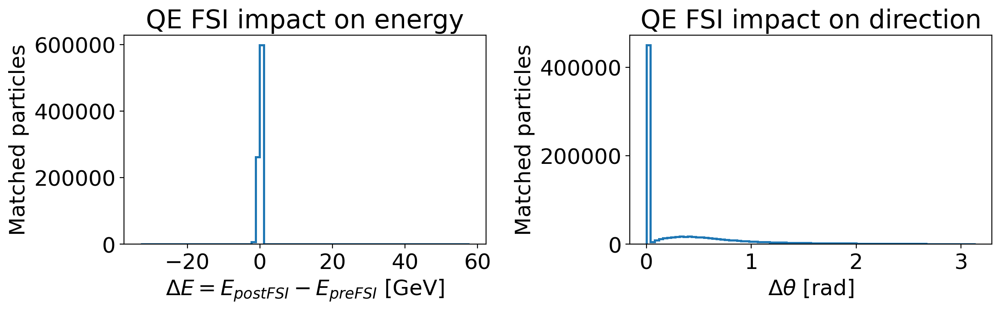

<ΔE> = -0.1041 GeV, RMS(ΔE) = 0.3594 GeV
<Δθ> = 0.3825 rad, RMS(Δθ) = 0.5826 rad


In [50]:
# QE pre/post-FSI matching and FSI impact plots (matched particles only)
import importlib
import numpy as np
import matplotlib.pyplot as plt
import systs as _systs

importlib.reload(_systs)
CAFManager = _systs.CAFManager

# If current `cafs` object is from an older class definition, rebuild it
if ('cafs' not in globals()) or (not hasattr(cafs, 'add_qe_fsi_matching')):
    caf_path = 'merged_new_systs.root'
    genie_path = 'genie_extracted_new_cafs.root'
    print(f"Rebuilding CAFManager from {caf_path} + {genie_path}")
    cafs = CAFManager(caf_path, genie=genie_path)

# Compute one-to-one PDG-constrained matching for QE events (mode == 1)
cafs.add_qe_fsi_matching(rel_energy_weight=0.2)
fsi_pairs = cafs.qe_fsi_match_long_table()

print(f"Matched QE particle pairs: {fsi_pairs.height}")
if fsi_pairs.height == 0:
    raise RuntimeError("No matched QE pre/post-FSI particle pairs were found.")

pairs = fsi_pairs.to_pandas()
delta_e = pairs['deltaE'].to_numpy(dtype=float)                # GeV
delta_theta = pairs['deltaTheta'].to_numpy(dtype=float)        # rad

valid = np.isfinite(delta_e) & np.isfinite(delta_theta)
delta_e = delta_e[valid]
delta_theta = delta_theta[valid]

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].hist(delta_e, bins=80, histtype='step', linewidth=1.8)
axes[0].set_xlabel(r'$\Delta E = E_{postFSI} - E_{preFSI}$ [GeV]')
axes[0].set_ylabel('Matched particles')
axes[0].set_title('QE FSI impact on energy')

axes[1].hist(delta_theta, bins=80, histtype='step', linewidth=1.8)
axes[1].set_xlabel(r'$\Delta\theta$ [rad]')
axes[1].set_ylabel('Matched particles')
axes[1].set_title('QE FSI impact on direction')

plt.tight_layout()
plt.show()

print(f"<ΔE> = {np.mean(delta_e):.4f} GeV, RMS(ΔE) = {np.std(delta_e):.4f} GeV")
print(f"<Δθ> = {np.mean(delta_theta):.4f} rad, RMS(Δθ) = {np.std(delta_theta):.4f} rad")

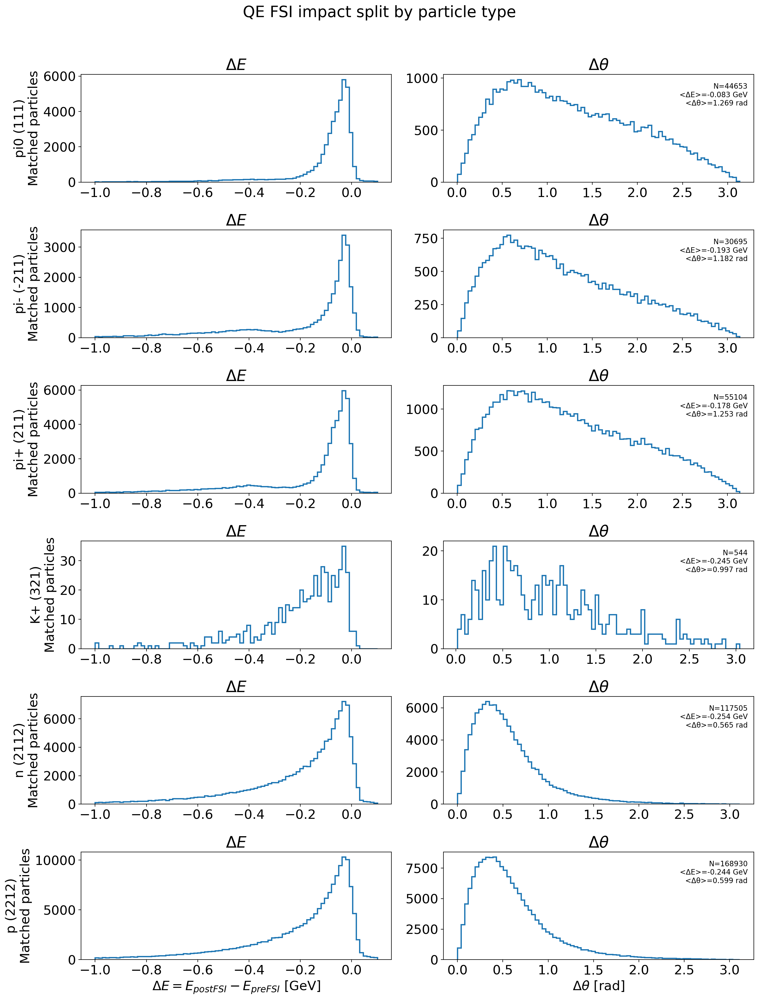

In [61]:
# Split QE FSI impact plots by particle type (PDG)
import numpy as np
import matplotlib.pyplot as plt

# Ensure we use matched pairs table with PDG information
if 'pairs' not in globals():
    pairs = fsi_pairs.to_pandas()

# Keep finite values and the same |ΔE| cut as before
mask = np.isfinite(pairs['deltaE'].to_numpy(dtype=float)) & np.isfinite(pairs['deltaTheta'].to_numpy(dtype=float))
mask &= (np.abs(pairs['deltaE'].to_numpy(dtype=float)) > 1e-3)
pairs_sel = pairs[mask].copy()

if pairs_sel.empty:
    raise RuntimeError('No matched QE pairs after selection.')

# Nice particle labels when available
try:
    import particle as _particle
    def _pdg_label(pdg):
        try:
            return f"{_particle.Particle.from_pdgid(int(pdg)).name} ({int(pdg)})"
        except Exception:
            return f"PDG {int(pdg)}"
except Exception:
    def _pdg_label(pdg):
        return f"PDG {int(pdg)}"

pdgs = sorted(pairs_sel['pdg'].unique(), key=lambda x: (abs(int(x)), int(x)))
n_types = len(pdgs)

fig, axes = plt.subplots(n_types, 2, figsize=(15, max(4, 3.2 * n_types)), squeeze=False)

for i, pdg in enumerate(pdgs):
    sub = pairs_sel[pairs_sel['pdg'] == pdg]
    de = sub['deltaE'].to_numpy(dtype=float)
    dt = sub['deltaTheta'].to_numpy(dtype=float)
    label = _pdg_label(pdg)

    axes[i, 0].hist(de, bins=80, histtype='step', linewidth=1.8, range=(-1, 0.1))
    axes[i, 0].set_ylabel(f'{label}\nMatched particles')
    axes[i, 0].set_title(r'$\Delta E$')

    axes[i, 1].hist(dt, bins=80, histtype='step', linewidth=1.8)
    axes[i, 1].set_title(r'$\Delta\theta$')

    # Per-particle quick stats in the title area
    axes[i, 1].text(
        0.98, 0.92,
        f'N={len(sub)}\n<ΔE>={np.mean(de):.3f} GeV\n<Δθ>={np.mean(dt):.3f} rad',
        transform=axes[i, 1].transAxes,
        ha='right', va='top', fontsize=10
    )

axes[-1, 0].set_xlabel(r'$\Delta E = E_{postFSI} - E_{preFSI}$ [GeV]')
axes[-1, 1].set_xlabel(r'$\Delta\theta$ [rad]')
fig.suptitle('QE FSI impact split by particle type', y=1.01)
fig.tight_layout()
plt.show()

Using fallback FSI systematic list (systs_groups["FSI"] not found in kernel).


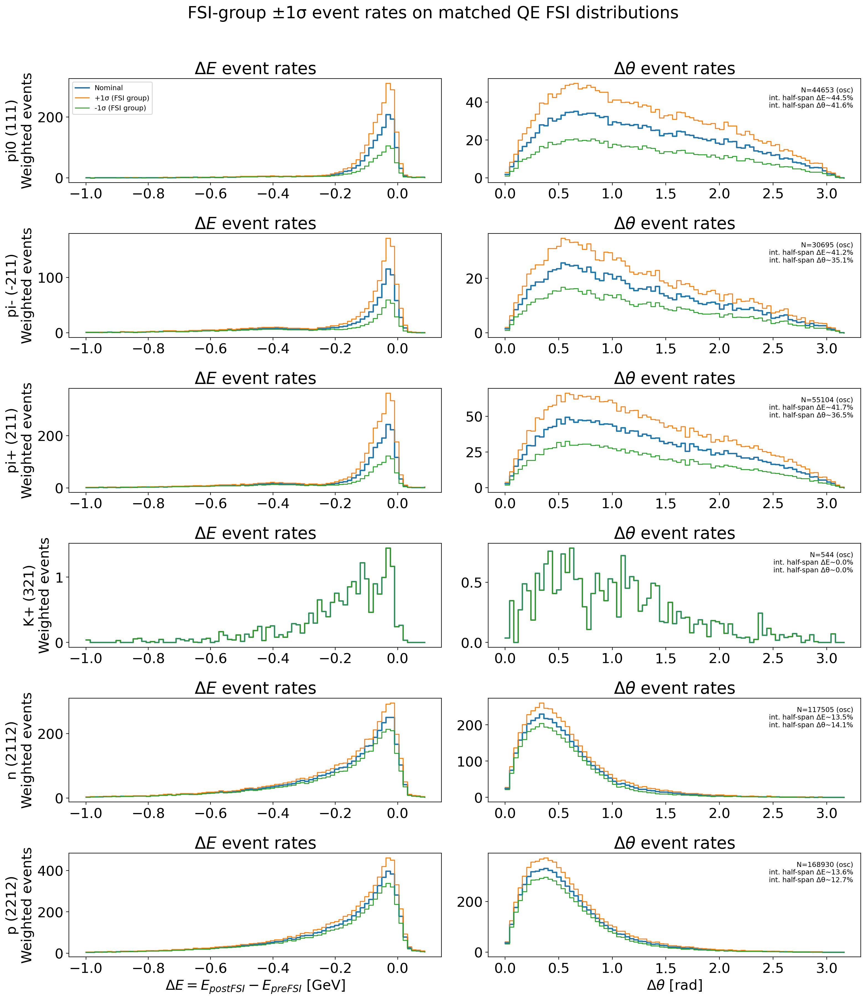

In [65]:
# FSI-systematics impact on matched QE FSI distributions (absolute event rates, split by particle type)
import numpy as np
import matplotlib.pyplot as plt

if 'pairs' not in globals():
    pairs = fsi_pairs.to_pandas()

# Use notebook-defined FSI group when available, otherwise fallback to the standard list
if 'systs_groups' in globals() and isinstance(systs_groups, dict) and ('FSI' in systs_groups):
    fsi_systs = systs_groups['FSI']
else:
    fsi_systs = ['FrAbs_N', 'FrAbs_pi', 'FrCEx_N', 'FrCEx_pi', 'FrInel_N', 'FrInel_pi', 'FrPiProd_N', 'FrPiProd_pi', 'MFP_N', 'MFP_pi']
    print('Using fallback FSI systematic list (systs_groups["FSI"] not found in kernel).')

# Same matched-pair selection used previously
mask = np.isfinite(pairs['deltaE'].to_numpy(dtype=float)) & np.isfinite(pairs['deltaTheta'].to_numpy(dtype=float))
mask &= (np.abs(pairs['deltaE'].to_numpy(dtype=float)) > 1e-3)
pairs_sel = pairs[mask].copy()

if pairs_sel.empty:
    raise RuntimeError('No matched QE pairs after selection.')

# Event-level base weights
base_w_evt_osc = cafs.data['final_oscillated_w'].to_numpy()
base_w_evt_unosc = (cafs.data['nue_w'] + cafs.data['numu_w']).to_numpy()

ev_idx_all = pairs_sel['event_index'].to_numpy(dtype=int)
delta_e_all = pairs_sel['deltaE'].to_numpy(dtype=float)
delta_theta_all = pairs_sel['deltaTheta'].to_numpy(dtype=float)
pdg_all = pairs_sel['pdg'].to_numpy(dtype=int)
base_w_all_osc = base_w_evt_osc[ev_idx_all]
base_w_all_unosc = base_w_evt_unosc[ev_idx_all]

# Particle labels
try:
    import particle as _particle
    def _pdg_label(pdg):
        try:
            return f"{_particle.Particle.from_pdgid(int(pdg)).name} ({int(pdg)})"
        except Exception:
            return f"PDG {int(pdg)}"
except Exception:
    def _pdg_label(pdg):
        return f"PDG {int(pdg)}"

pdgs = sorted(np.unique(pdg_all), key=lambda x: (abs(int(x)), int(x)))

# Histogram binning
bins_de = np.linspace(-1.0, 0.1, 81)
bins_dt = np.linspace(0.0, 3.2, 81)

# Preload ±1σ event weights for each FSI dial
var_cache = {}
for name in fsi_systs:
    syst_obj = systs.get_syst(name)
    v = variation_manager.get_1sigma_variations(syst_obj)
    var_cache[name] = {
        'up': v['up_1sigma'].to_numpy(),
        'down': v['down_1sigma'].to_numpy(),
    }


def combined_event_rates(values, ev_idx, base_w, bins):
    nominal, _ = np.histogram(values, bins=bins, weights=base_w)

    sigma_up2 = np.zeros_like(nominal, dtype=float)
    sigma_down2 = np.zeros_like(nominal, dtype=float)

    for name in fsi_systs:
        up_evt = var_cache[name]['up'][ev_idx]
        down_evt = var_cache[name]['down'][ev_idx]

        h_up, _ = np.histogram(values, bins=bins, weights=base_w * up_evt)
        h_down, _ = np.histogram(values, bins=bins, weights=base_w * down_evt)

        pos_dev = np.maximum(np.maximum(h_up - nominal, h_down - nominal), 0.0)
        neg_dev = np.maximum(np.maximum(nominal - h_up, nominal - h_down), 0.0)

        sigma_up2 += pos_dev**2
        sigma_down2 += neg_dev**2

    plus_1s = nominal + np.sqrt(sigma_up2)
    minus_1s = np.maximum(nominal - np.sqrt(sigma_down2), 0.0)
    return nominal, plus_1s, minus_1s


fig, axes = plt.subplots(len(pdgs), 2, figsize=(16, max(4, 3.0 * len(pdgs))), squeeze=False)

for i, pdg in enumerate(pdgs):
    sel = (pdg_all == pdg)

    de = delta_e_all[sel]
    dt = delta_theta_all[sel]
    ev = ev_idx_all[sel]

    # Prefer oscillated weights, fallback to unoscillated if normalization is too small
    bw = base_w_all_osc[sel]
    weight_mode = 'osc'
    if np.sum(bw) <= 0:
        bw = base_w_all_unosc[sel]
        weight_mode = 'unosc'

    nom_de, up_de, dn_de = combined_event_rates(de, ev, bw, bins_de)
    nom_dt, up_dt, dn_dt = combined_event_rates(dt, ev, bw, bins_dt)

    x_de = bins_de[:-1]
    x_dt = bins_dt[:-1]

    # ΔE panel: absolute event rates
    axes[i, 0].step(x_de, nom_de, where='post', lw=1.8, label='Nominal')
    axes[i, 0].step(x_de, up_de, where='post', lw=1.2, label='+1σ (FSI group)')
    axes[i, 0].step(x_de, dn_de, where='post', lw=1.2, label='-1σ (FSI group)')
    axes[i, 0].set_title(r'$\Delta E$ event rates')
    axes[i, 0].set_ylabel(f"{_pdg_label(pdg)}\nWeighted events")

    # Δθ panel: absolute event rates
    axes[i, 1].step(x_dt, nom_dt, where='post', lw=1.8, label='Nominal')
    axes[i, 1].step(x_dt, up_dt, where='post', lw=1.2, label='+1σ (FSI group)')
    axes[i, 1].step(x_dt, dn_dt, where='post', lw=1.2, label='-1σ (FSI group)')
    axes[i, 1].set_title(r'$\Delta\theta$ event rates')

    int_nom_de = np.sum(nom_de)
    int_nom_dt = np.sum(nom_dt)
    frac_de = 100.0 * (np.sum(up_de) - np.sum(dn_de)) / (2 * int_nom_de) if int_nom_de > 0 else 0.0
    frac_dt = 100.0 * (np.sum(up_dt) - np.sum(dn_dt)) / (2 * int_nom_dt) if int_nom_dt > 0 else 0.0

    axes[i, 1].text(
        0.98, 0.92,
        f"N={sel.sum()} ({weight_mode})\nint. half-span ΔE~{frac_de:.1f}%\nint. half-span Δθ~{frac_dt:.1f}%",
        transform=axes[i, 1].transAxes,
        ha='right', va='top', fontsize=9
    )

# Keep one legend to reduce clutter
axes[0, 0].legend(loc='upper left', fontsize=9)
axes[-1, 0].set_xlabel(r'$\Delta E = E_{postFSI} - E_{preFSI}$ [GeV]')
axes[-1, 1].set_xlabel(r'$\Delta\theta$ [rad]')
fig.suptitle('FSI-group ±1σ event rates on matched QE FSI distributions', y=1.01)
fig.tight_layout()
plt.show()

Using fallback FSI systematic list (systs_groups["FSI"] not found in kernel).


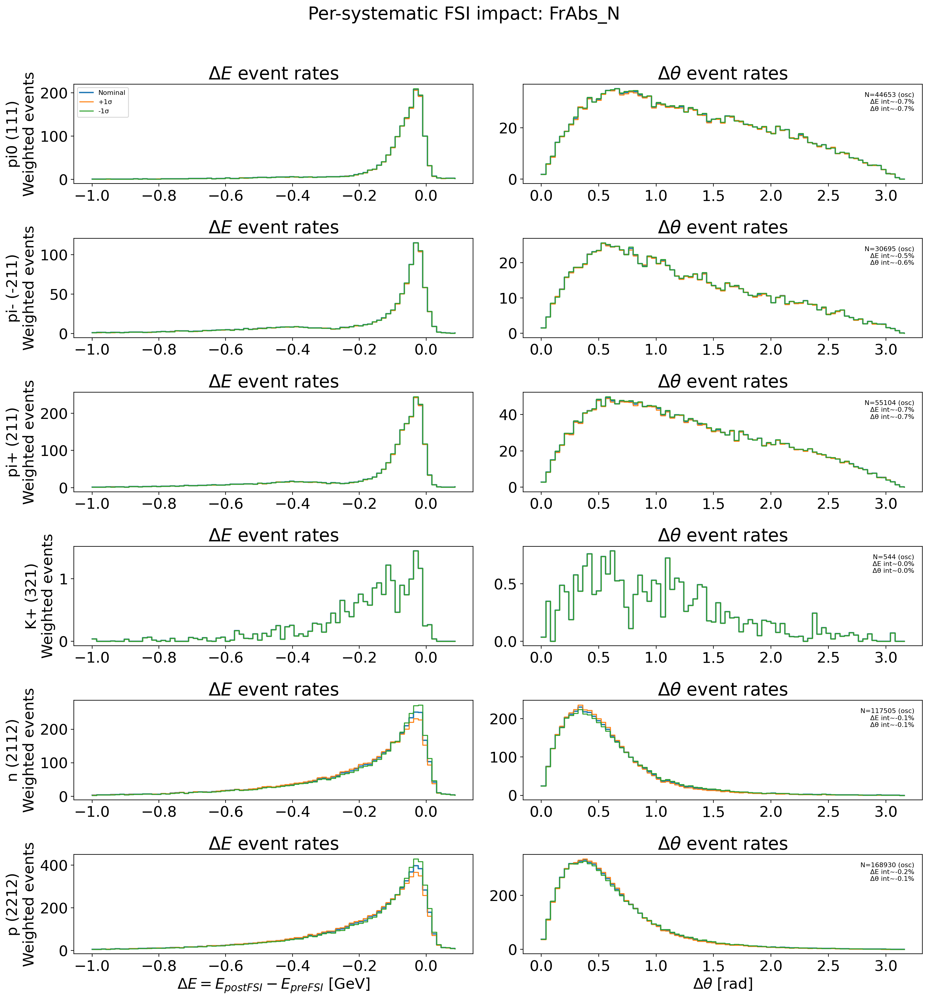

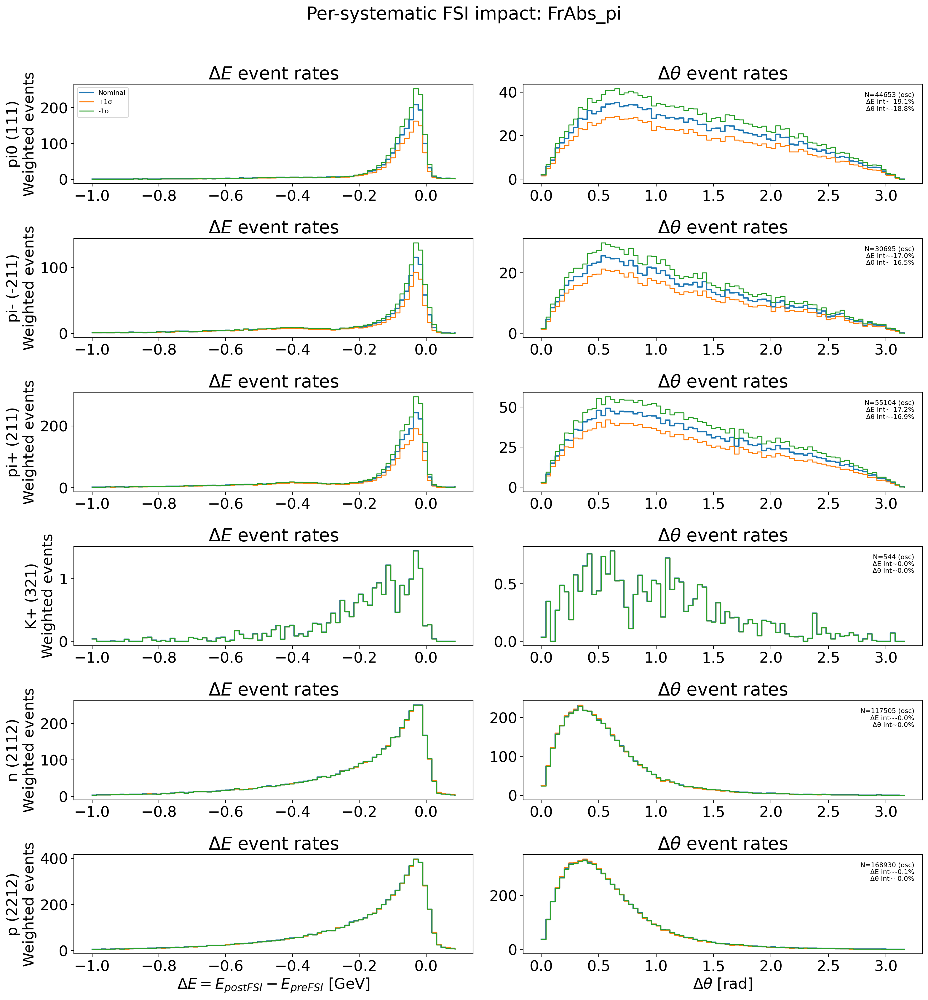

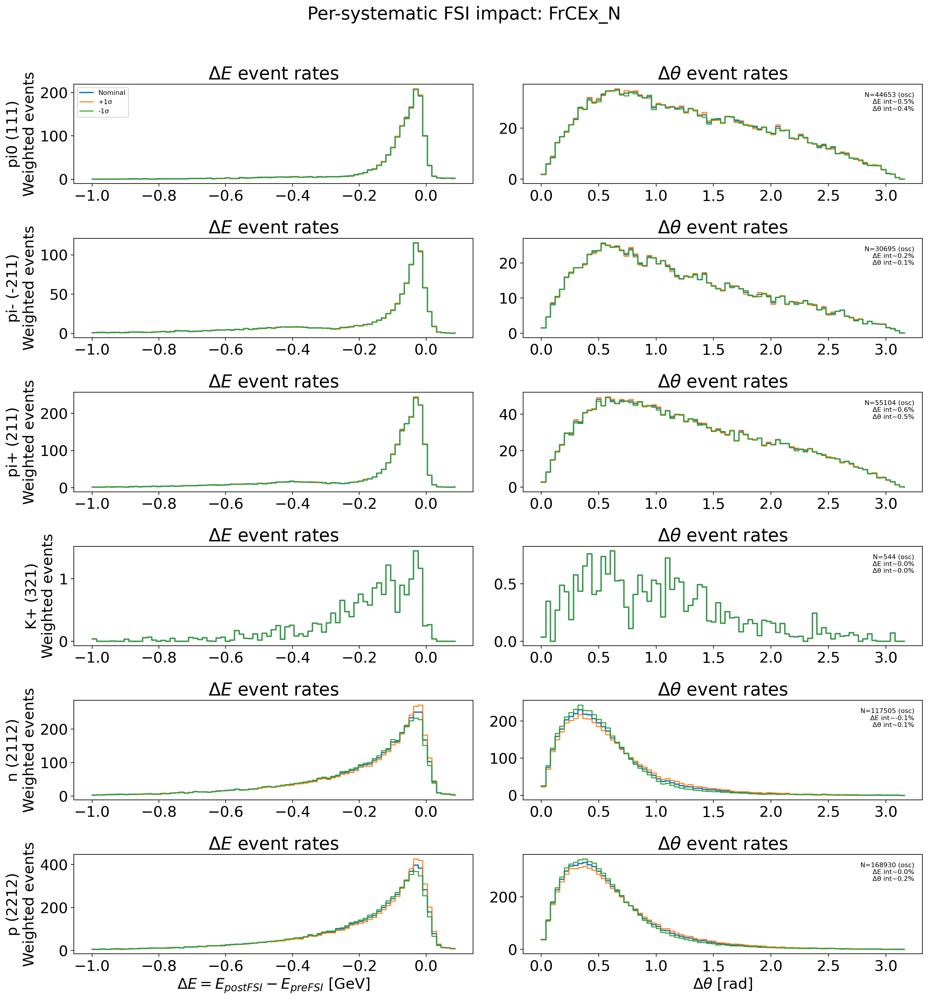

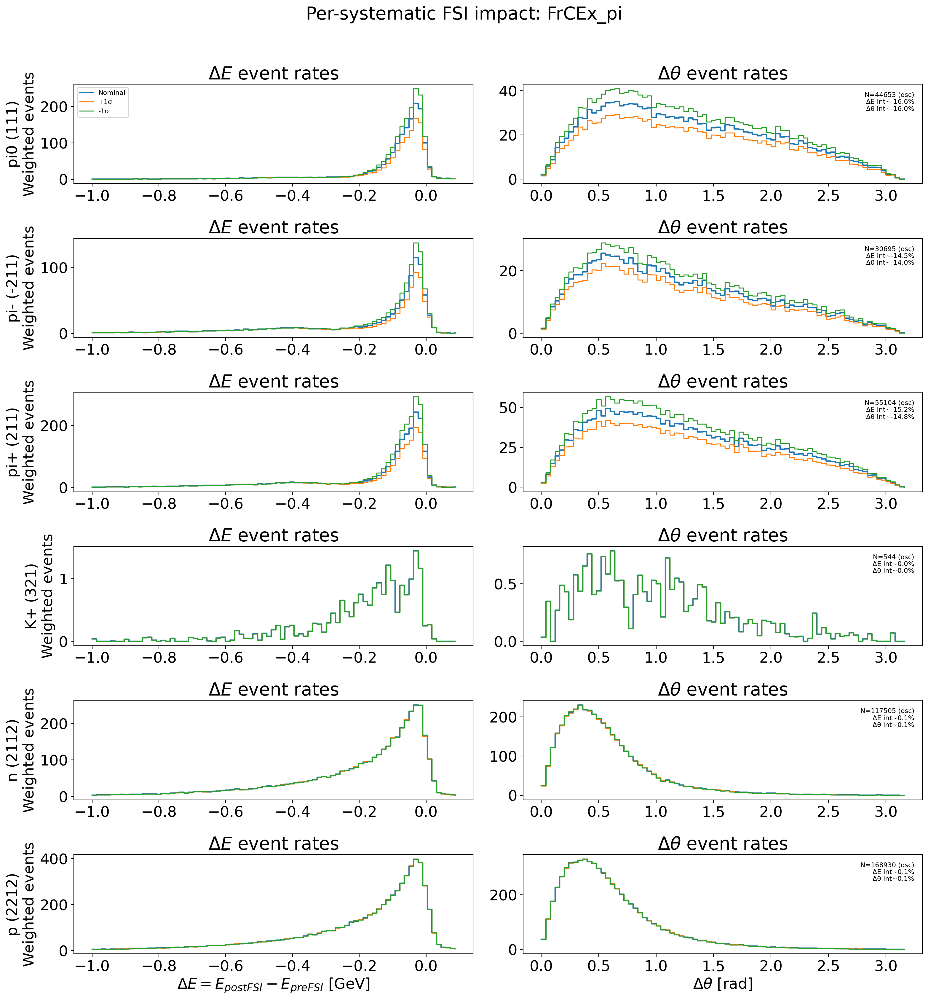

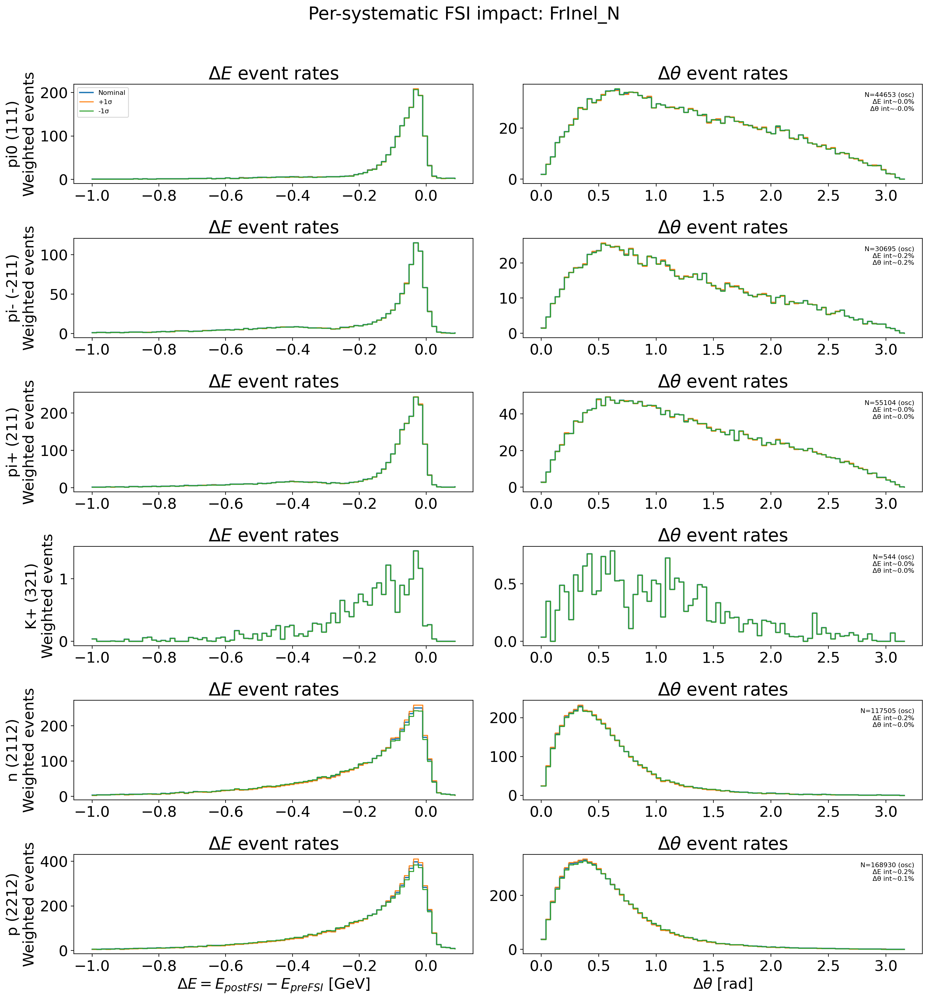

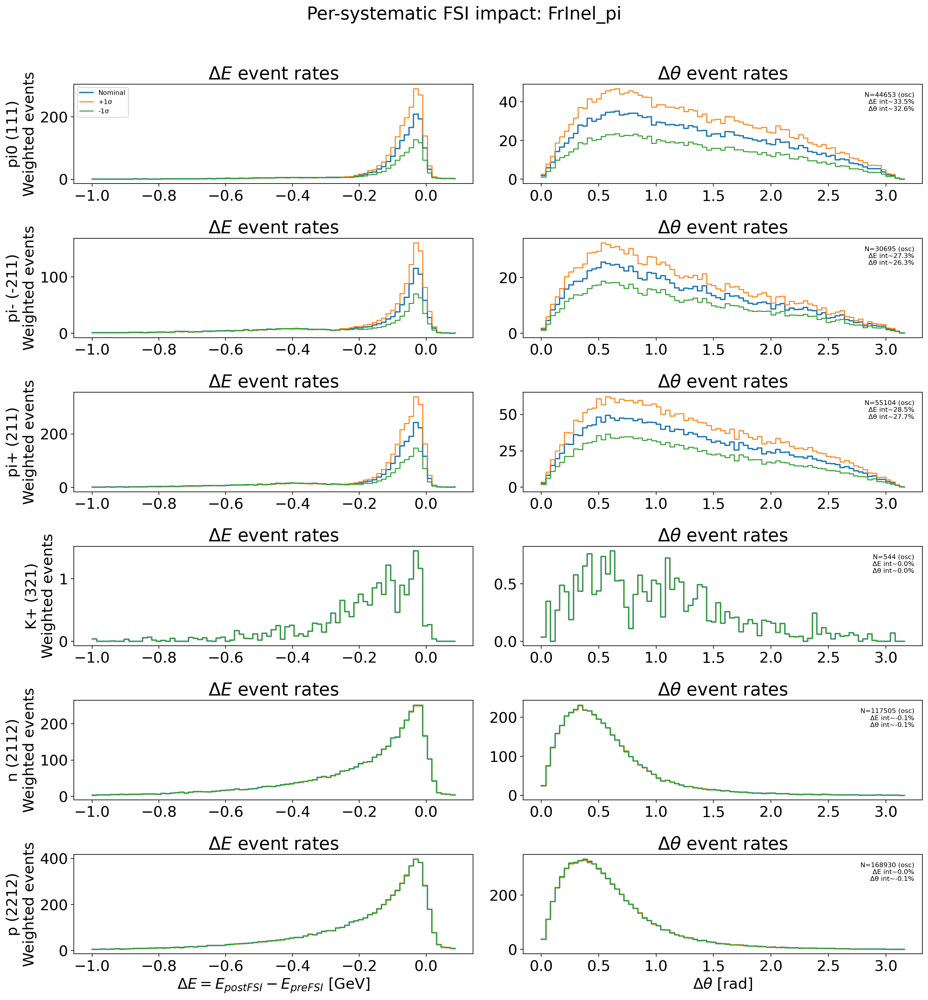

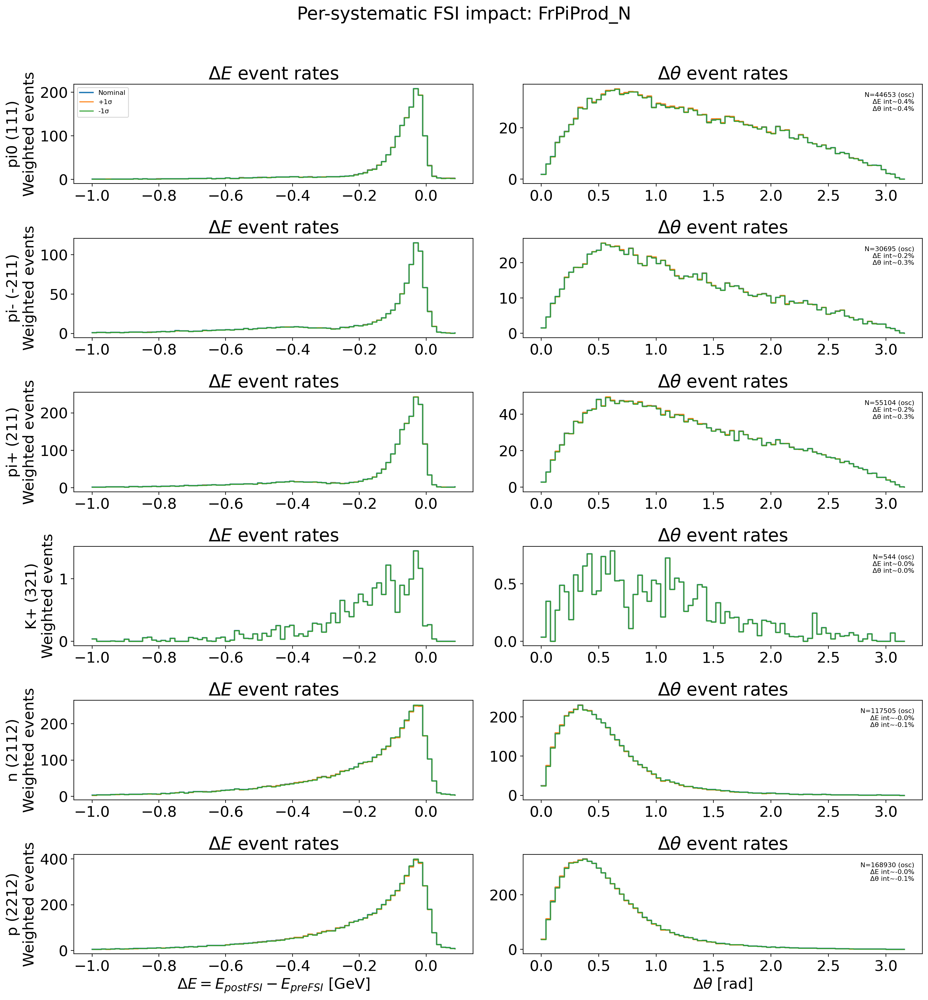

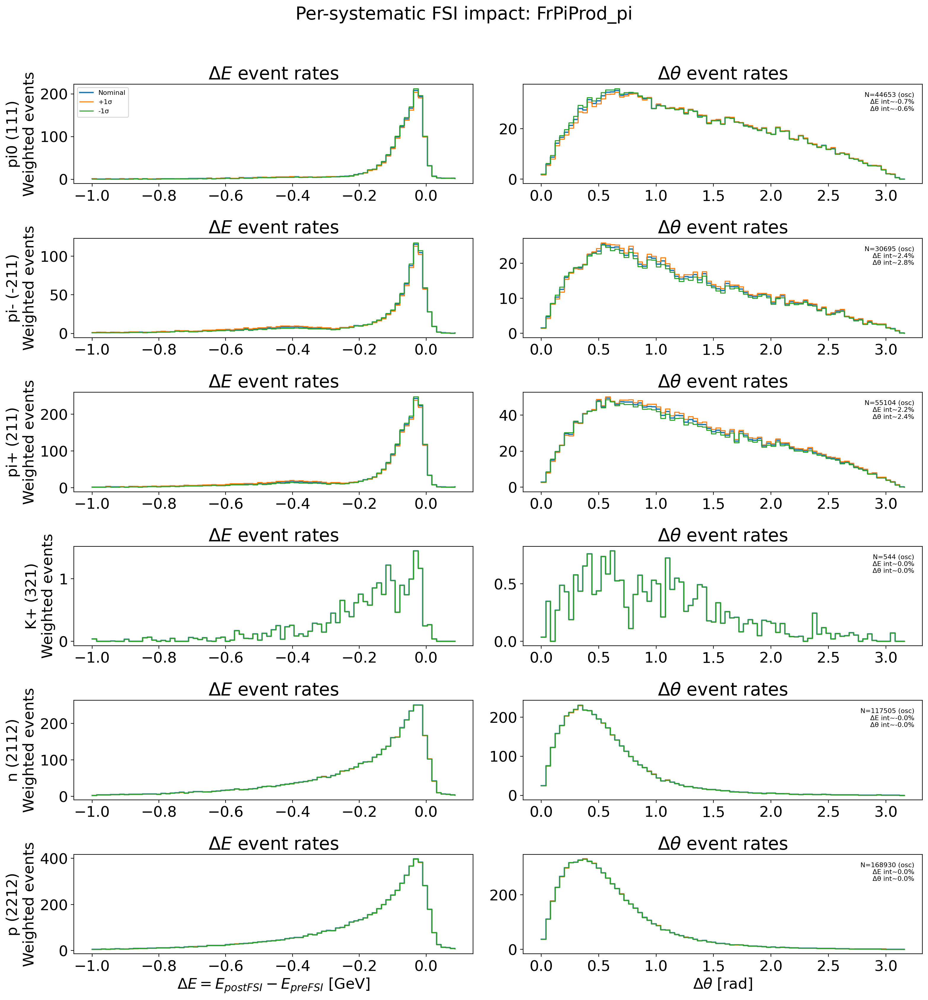

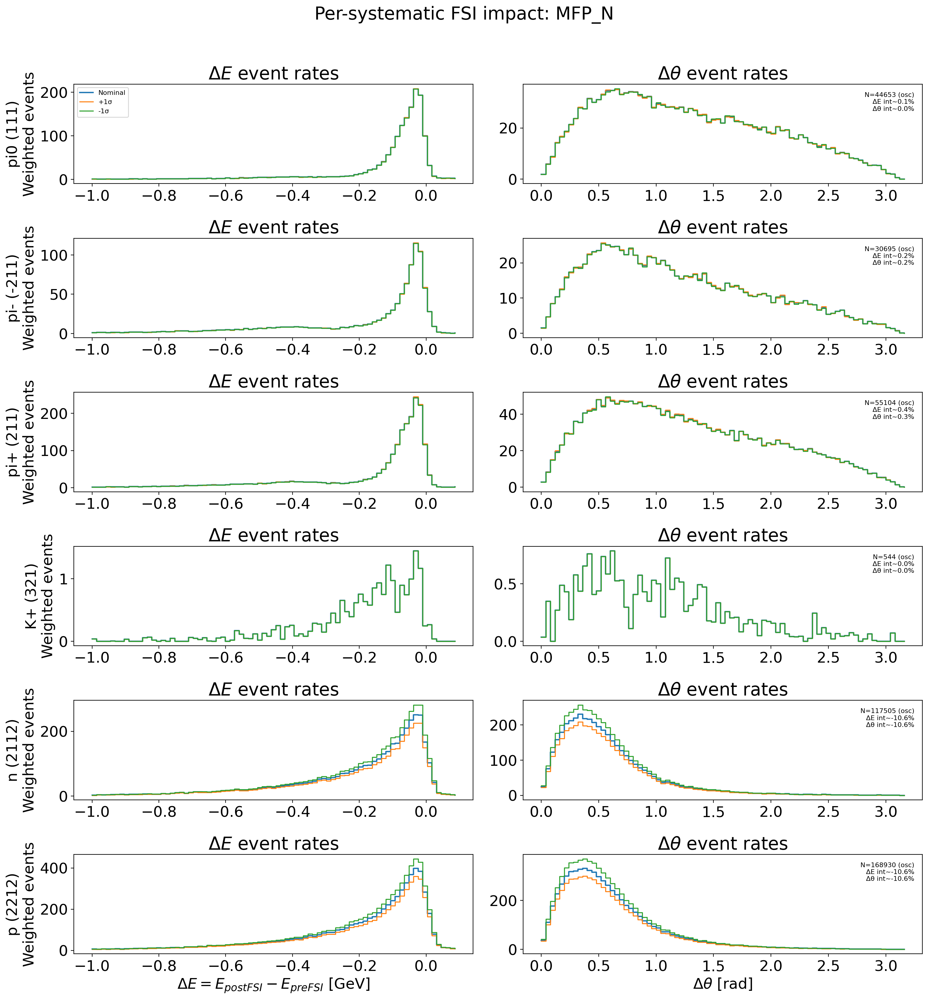

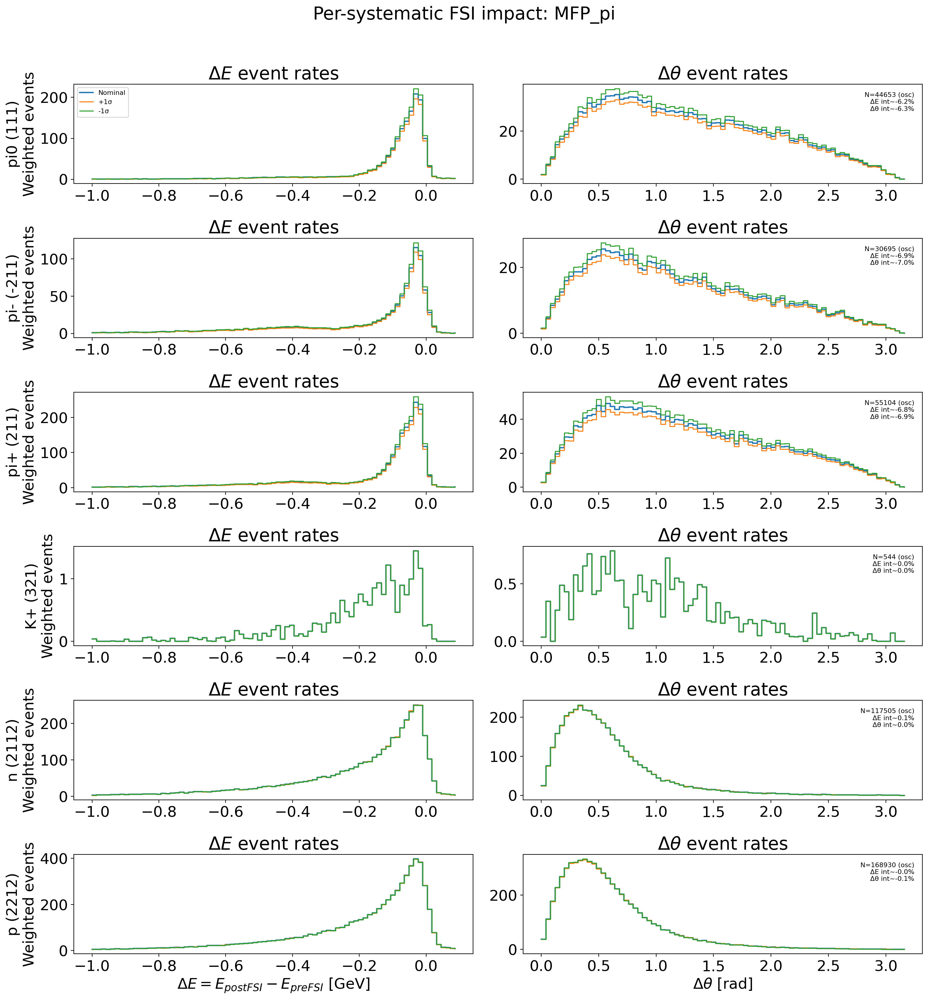

Top affected particle types per FSI systematic (by max-bin half-span in ΔE):

FrAbs_N


,particle,N_pairs,int_half_pct_dE,int_half_pct_dTheta,maxbin_half_pct_dE,maxbin_half_pct_dTheta
4,n (2112),117505,-0.098871,-0.050991,8.839226,2.590578
5,p (2212),168930,-0.183978,-0.128278,8.496912,1.800660
2,pi+ (211),55104,-0.696706,-0.711773,0.810130,1.615974
0,pi0 (111),44653,-0.659695,-0.667905,0.723813,1.464502



FrAbs_pi


,particle,N_pairs,int_half_pct_dE,int_half_pct_dTheta,maxbin_half_pct_dE,maxbin_half_pct_dTheta
6,pi0 (111),44653,-19.149064,-18.839342,21.558178,17.985099
8,pi+ (211),55104,-17.216262,-16.867695,21.179725,15.648783
7,pi- (-211),30695,-16.984735,-16.546359,19.296132,16.810968
10,n (2112),117505,-0.047691,0.016076,0.685488,1.022089



FrCEx_N


,particle,N_pairs,int_half_pct_dE,int_half_pct_dTheta,maxbin_half_pct_dE,maxbin_half_pct_dTheta
17,p (2212),168930,0.027348,0.196795,9.045262,4.489118
16,n (2112),117505,-0.084995,0.134971,8.788589,5.689703
12,pi0 (111),44653,0.451304,0.366339,0.995275,2.979164
14,pi+ (211),55104,0.597425,0.541724,0.985726,1.963292



FrCEx_pi


,particle,N_pairs,int_half_pct_dE,int_half_pct_dTheta,maxbin_half_pct_dE,maxbin_half_pct_dTheta
20,pi+ (211),55104,-15.214654,-14.794257,20.240115,15.698569
18,pi0 (111),44653,-16.631005,-16.044576,19.654948,17.194367
19,pi- (-211),30695,-14.509346,-14.005301,19.565342,13.899798
22,n (2112),117505,0.105104,0.058066,0.609944,0.854234



FrInel_N


,particle,N_pairs,int_half_pct_dE,int_half_pct_dTheta,maxbin_half_pct_dE,maxbin_half_pct_dTheta
28,n (2112),117505,0.161974,0.021231,3.448422,1.116465
29,p (2212),168930,0.178689,0.062904,3.296672,1.426091
26,pi+ (211),55104,0.038827,0.024177,0.652134,0.846444
25,pi- (-211),30695,0.169028,0.185003,0.492901,0.917700



FrInel_pi


,particle,N_pairs,int_half_pct_dE,int_half_pct_dTheta,maxbin_half_pct_dE,maxbin_half_pct_dTheta
32,pi+ (211),55104,28.474921,27.672699,39.356762,27.738894
31,pi- (-211),30695,27.314907,26.340954,39.181226,27.182947
30,pi0 (111),44653,33.493022,32.647407,39.178440,33.080970
35,p (2212),168930,0.012753,-0.051174,0.627442,0.918756



FrPiProd_N


,particle,N_pairs,int_half_pct_dE,int_half_pct_dTheta,maxbin_half_pct_dE,maxbin_half_pct_dTheta
41,p (2212),168930,-0.019860,-0.078989,0.635431,0.871257
40,n (2112),117505,-0.021308,-0.082087,0.607763,0.735181
37,pi- (-211),30695,0.187249,0.257739,0.135167,0.644676
36,pi0 (111),44653,0.350990,0.449227,0.128472,0.850191



FrPiProd_pi


,particle,N_pairs,int_half_pct_dE,int_half_pct_dTheta,maxbin_half_pct_dE,maxbin_half_pct_dTheta
43,pi- (-211),30695,2.434155,2.752228,2.154920,3.820254
44,pi+ (211),55104,2.180588,2.445280,1.933513,3.554205
42,pi0 (111),44653,-0.744107,-0.622160,1.918141,3.692584
46,n (2112),117505,-0.003748,-0.016170,0.224348,0.410224



MFP_N


,particle,N_pairs,int_half_pct_dE,int_half_pct_dTheta,maxbin_half_pct_dE,maxbin_half_pct_dTheta
52,n (2112),117505,-10.648537,-10.600220,11.235492,10.547752
53,p (2212),168930,-10.613369,-10.554567,10.636970,10.636031
50,pi+ (211),55104,0.351619,0.323166,0.643594,1.048164
49,pi- (-211),30695,0.232467,0.197694,0.432091,1.234976



MFP_pi


,particle,N_pairs,int_half_pct_dE,int_half_pct_dTheta,maxbin_half_pct_dE,maxbin_half_pct_dTheta
56,pi+ (211),55104,-6.800759,-6.853106,6.141896,7.538295
54,pi0 (111),44653,-6.198300,-6.269065,5.863049,7.062733
55,pi- (-211),30695,-6.901842,-6.972175,5.345324,7.214006
58,n (2112),117505,0.060276,0.031032,0.627736,0.544952


In [66]:
# Per-FSI-dial diagnostics: one figure per systematic + quantitative impact table
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

if 'pairs' not in globals():
    pairs = fsi_pairs.to_pandas()

# FSI dial list
if 'systs_groups' in globals() and isinstance(systs_groups, dict) and ('FSI' in systs_groups):
    fsi_systs = systs_groups['FSI']
else:
    fsi_systs = ['FrAbs_N', 'FrAbs_pi', 'FrCEx_N', 'FrCEx_pi', 'FrInel_N', 'FrInel_pi', 'FrPiProd_N', 'FrPiProd_pi', 'MFP_N', 'MFP_pi']
    print('Using fallback FSI systematic list (systs_groups["FSI"] not found in kernel).')

# Matched-pair selection (same as previous cells)
mask = np.isfinite(pairs['deltaE'].to_numpy(dtype=float)) & np.isfinite(pairs['deltaTheta'].to_numpy(dtype=float))
mask &= (np.abs(pairs['deltaE'].to_numpy(dtype=float)) > 1e-3)
pairs_sel = pairs[mask].copy()

if pairs_sel.empty:
    raise RuntimeError('No matched QE pairs after selection.')

# Event-level weights
base_w_evt_osc = cafs.data['final_oscillated_w'].to_numpy()
base_w_evt_unosc = (cafs.data['nue_w'] + cafs.data['numu_w']).to_numpy()

ev_idx_all = pairs_sel['event_index'].to_numpy(dtype=int)
delta_e_all = pairs_sel['deltaE'].to_numpy(dtype=float)
delta_theta_all = pairs_sel['deltaTheta'].to_numpy(dtype=float)
pdg_all = pairs_sel['pdg'].to_numpy(dtype=int)
base_w_all_osc = base_w_evt_osc[ev_idx_all]
base_w_all_unosc = base_w_evt_unosc[ev_idx_all]

# Labels
try:
    import particle as _particle
    def _pdg_label(pdg):
        try:
            return f"{_particle.Particle.from_pdgid(int(pdg)).name} ({int(pdg)})"
        except Exception:
            return f"PDG {int(pdg)}"
except Exception:
    def _pdg_label(pdg):
        return f"PDG {int(pdg)}"

pdgs = sorted(np.unique(pdg_all), key=lambda x: (abs(int(x)), int(x)))

# Histogram bins
bins_de = np.linspace(-1.0, 0.1, 81)
bins_dt = np.linspace(0.0, 3.2, 81)

# Cache single-dial up/down arrays
single_var_cache = {}
for name in fsi_systs:
    syst_obj = systs.get_syst(name)
    v = variation_manager.get_1sigma_variations(syst_obj)
    single_var_cache[name] = {
        'up': v['up_1sigma'].to_numpy(),
        'down': v['down_1sigma'].to_numpy(),
    }


def single_syst_event_rates(values, ev_idx, base_w, bins, syst_name):
    nominal, _ = np.histogram(values, bins=bins, weights=base_w)
    up_evt = single_var_cache[syst_name]['up'][ev_idx]
    down_evt = single_var_cache[syst_name]['down'][ev_idx]
    up, _ = np.histogram(values, bins=bins, weights=base_w * up_evt)
    down, _ = np.histogram(values, bins=bins, weights=base_w * down_evt)
    return nominal, up, down


# Optional throttle for notebook output volume: set to None for all
max_systematics_to_plot = None
plot_systs = fsi_systs if max_systematics_to_plot is None else fsi_systs[:max_systematics_to_plot]

summary_rows = []

for syst_name in plot_systs:
    fig, axes = plt.subplots(len(pdgs), 2, figsize=(16, max(4, 2.8 * len(pdgs))), squeeze=False)

    for i, pdg in enumerate(pdgs):
        sel = (pdg_all == pdg)
        de = delta_e_all[sel]
        dt = delta_theta_all[sel]
        ev = ev_idx_all[sel]

        bw = base_w_all_osc[sel]
        weight_mode = 'osc'
        if np.sum(bw) <= 0:
            bw = base_w_all_unosc[sel]
            weight_mode = 'unosc'

        nom_de, up_de, dn_de = single_syst_event_rates(de, ev, bw, bins_de, syst_name)
        nom_dt, up_dt, dn_dt = single_syst_event_rates(dt, ev, bw, bins_dt, syst_name)

        x_de = bins_de[:-1]
        x_dt = bins_dt[:-1]

        axes[i, 0].step(x_de, nom_de, where='post', lw=1.6, label='Nominal')
        axes[i, 0].step(x_de, up_de, where='post', lw=1.2, label='+1σ')
        axes[i, 0].step(x_de, dn_de, where='post', lw=1.2, label='-1σ')
        axes[i, 0].set_title(r'$\Delta E$ event rates')
        axes[i, 0].set_ylabel(f"{_pdg_label(pdg)}\nWeighted events")

        axes[i, 1].step(x_dt, nom_dt, where='post', lw=1.6, label='Nominal')
        axes[i, 1].step(x_dt, up_dt, where='post', lw=1.2, label='+1σ')
        axes[i, 1].step(x_dt, dn_dt, where='post', lw=1.2, label='-1σ')
        axes[i, 1].set_title(r'$\Delta\theta$ event rates')

        int_nom_de = np.sum(nom_de)
        int_nom_dt = np.sum(nom_dt)
        int_half_de = 100.0 * (np.sum(up_de) - np.sum(dn_de)) / (2 * int_nom_de) if int_nom_de > 0 else 0.0
        int_half_dt = 100.0 * (np.sum(up_dt) - np.sum(dn_dt)) / (2 * int_nom_dt) if int_nom_dt > 0 else 0.0

        maxbin_nom_de = np.max(nom_de)
        maxbin_nom_dt = np.max(nom_dt)
        maxbin_half_de = 100.0 * np.max(np.abs(up_de - dn_de)) / (2 * maxbin_nom_de) if maxbin_nom_de > 0 else 0.0
        maxbin_half_dt = 100.0 * np.max(np.abs(up_dt - dn_dt)) / (2 * maxbin_nom_dt) if maxbin_nom_dt > 0 else 0.0

        summary_rows.append({
            'systematic': syst_name,
            'pdg': int(pdg),
            'particle': _pdg_label(pdg),
            'N_pairs': int(sel.sum()),
            'weight_mode': weight_mode,
            'int_half_pct_dE': float(int_half_de),
            'int_half_pct_dTheta': float(int_half_dt),
            'maxbin_half_pct_dE': float(maxbin_half_de),
            'maxbin_half_pct_dTheta': float(maxbin_half_dt),
        })

        axes[i, 1].text(
            0.98, 0.92,
            f"N={sel.sum()} ({weight_mode})\nΔE int~{int_half_de:.1f}%\nΔθ int~{int_half_dt:.1f}%",
            transform=axes[i, 1].transAxes,
            ha='right', va='top', fontsize=8
        )

    axes[0, 0].legend(loc='upper left', fontsize=8)
    axes[-1, 0].set_xlabel(r'$\Delta E = E_{postFSI} - E_{preFSI}$ [GeV]')
    axes[-1, 1].set_xlabel(r'$\Delta\theta$ [rad]')
    fig.suptitle(f'Per-systematic FSI impact: {syst_name}', y=1.01)
    fig.tight_layout()
    plt.show()

# Quantitative cross-check table
impact_df = pd.DataFrame(summary_rows)
impact_df = impact_df.sort_values(['systematic', 'maxbin_half_pct_dE', 'maxbin_half_pct_dTheta'], ascending=[True, False, False])
print('Top affected particle types per FSI systematic (by max-bin half-span in ΔE):')
for syst_name in fsi_systs:
    sub = impact_df[impact_df['systematic'] == syst_name].head(4)
    print('\n' + syst_name)
    display(sub[['particle', 'N_pairs', 'int_half_pct_dE', 'int_half_pct_dTheta', 'maxbin_half_pct_dE', 'maxbin_half_pct_dTheta']])